 <font size="10">Méthodes de segmentation KMEANS</font>

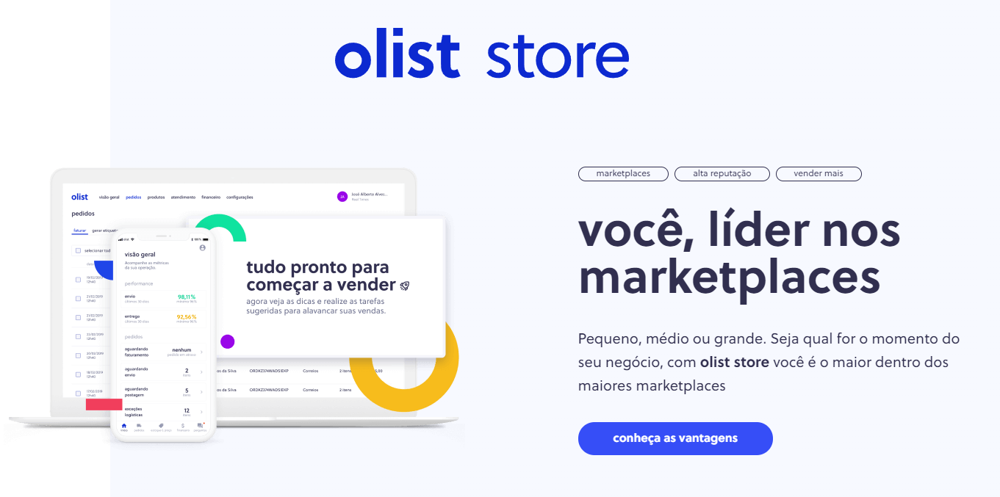

# Importation et préparation des données

Avant de commencer, nous vérifions que le code fourni respecte la convention PEP8.

In [1]:
# numpy and pandas pour la manipulation des données
import numpy as np
import pandas as pd
# matplotlib and seaborn pour les représentations graphiques
import matplotlib.pyplot as plt
import seaborn as sns

# File system management
import os

# Suppress warnings
import warnings

warnings.filterwarnings('ignore')

In [2]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.cm as cm

# classification non supervisée
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from sklearn.cluster import MiniBatchKMeans

from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import davies_bouldin_score


from sklearn.decomposition import PCA

a, b, c, d, e = [
    plt.cm.Blues, plt.cm.Oranges, plt.cm.Reds, plt.cm.Greens, plt.cm.Purples
]

import plotly.graph_objs as go

In [3]:
from my_functions import *

In [4]:
df.head(2)

,customer_unique_id,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,autres,cadeaux,denrees_alimentaires,...,freight_ratio,moy_prix_commande,moy_prix_article,customer_zip_code_prefix,customer_city,j_derniere_commande,Etat_geo_client,geolocation_lat,geolocation_lng,d_harv
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.9,1.0,8.0,5.0,6.0,0.0,0.0,0.0,...,0.08,129.9,129.9,7787,cajamar,111,São Paulo,-23.340235,-46.830140,30.784607
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.9,1.0,1.0,4.0,3.0,0.0,0.0,0.0,...,0.30,18.9,18.9,6053,osasco,114,São Paulo,-23.559115,-46.787626,15.709783


# Analyse Descriptive : partitionner avec l'algorithme  k-means

L'algorithme des K-Means est un algorithme de clustering (de partitionnement). Il permet de regrouper les données en un certain nombre de groupes (clusters). Les points de chaque groupe partagent des tendances, des modes en commun.

Son principe est simple : l'algorithme commence par une étape d'initialisation. Elle consiste à définir k  données de la base de données comme des centroïdes. k est un paramètre donné par l'utilisateur. L'algorithme assigne un groupe aux données proches de chaque centroïde. Il replace le centroïde de façon à choisir le point du groupe qui a la plus petite variance avec les autres (le carré des distances euclidiennes). Ensuite il recommence jusqu'à trouver les centroïdes et les groupes qui minimisent la variance. A chaque étape, l'algorithme trouve un partitionnement meilleur qu'à l'étape précédente. De par ce fait, il va toujours finir par converger en un temps fini. C'est un des avantages de cette méthode.

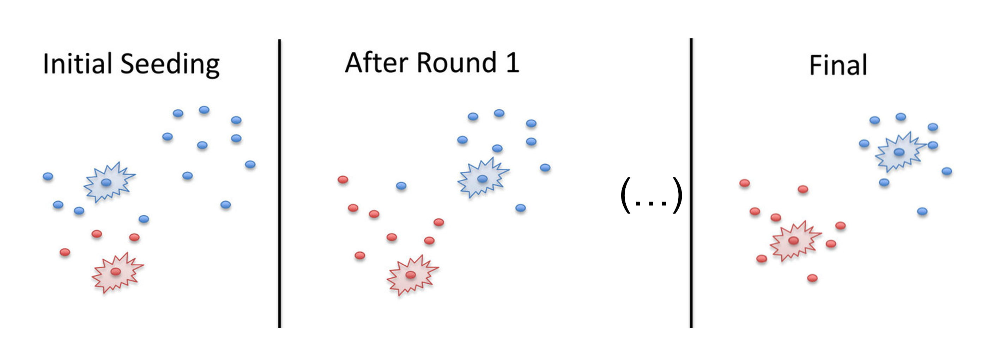)
( D'après : *Page, Justin & Liechty, Zach & Huynh, Mark & Udall, Joshua. (2014). BamBam: Genome sequence analysis tools for biologists. BMC research notes. 7. 829. 10.1186/1756-0500-7-829 )

## Méthode des K-means avec l'ensemble des variables

In [5]:
data = df.copy(deep=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93103 entries, 0 to 93102
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   customer_unique_id            93103 non-null  object 
 1   nb_commandes                  93103 non-null  int64  
 2   total_depense                 93103 non-null  float64
 3   moy_nb_moyens_paiements       93103 non-null  float64
 4   moy_tot_versements_paiements  93103 non-null  float64
 5   moy_review_score              93103 non-null  float64
 6   moy_delai_livraison           93103 non-null  float64
 7   autres                        93103 non-null  float64
 8   cadeaux                       93103 non-null  float64
 9   denrees_alimentaires          93103 non-null  float64
 10  enfants                       93103 non-null  float64
 11  maison_intérieur              93103 non-null  float64
 12  matériaux_outils              93103 non-null  float64
 13  m

In [6]:
data.drop(columns=[
    "customer_unique_id", "moy_nb_articles", "moy_prix_commande",
    "total_cde_et_fre", 'customer_zip_code_prefix', "customer_city",
    'geolocation_lat', 'geolocation_lng'
],
          axis=1,
          inplace=True)
print(f"La base de données contient {data.shape[1]} variables.")

La base de données contient 23 variables.


Pour faire les tests nous allons prendre un échantillon pour éviter que l'étude soit trop chronophage. Nous avons presque 100 000 données, prenons un échantillon de 10 000, soit un peu plus de 10%. Pour correctement utiliser l'algorithme des K-means, il est important de standardiser les données. Cette étape se fait grâce à la méthode Standard Scaler.

In [7]:
# Cette fonction retourne une base de données quantitative standardisée
X, X_sc = stdX(data)


*Fonction by Sandy M.*

### La méthode du coude

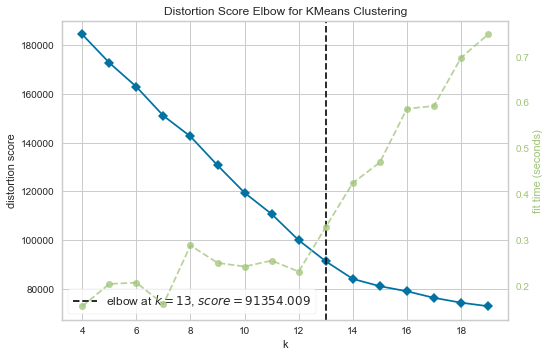


*Fonction by Sandy M.*

In [8]:
pif_kmeans(X_sc, 'distortion',(4, 20))

Ici l'algorithme des k-means a été lancé avec plusieurs valeurs de k (nombre de clusters). Le nombre de clusters est représenté en abscisse. Chaque calcul donne k groupes avec un centroïde pour chaque groupe. La variance est la somme des carrés des distances euclidiennes entre le centroïde et les points du groupe. Pour trouver le bon nombre de clusters il faut minimiser ces distances (les distances intra-classes). En suivant la méthode du coude, le nombre k choisi est celui à partir duquel la variance (distortion sur le graphique, par défaut, le métrique est "distortion") ne se réduit plus de façon significative. Sur ce graphique il se trouve à 14.

### Silhouette

Le coefficient de silhouette est calculé pour chaque point. Pour un point donné, il correspond à la différence entre la distance moyenne entre lui et les points de son groupe (la distance moyenne intra-cluster, c'est la cohésion) et la distance moyenne entre lui et les points des autres groupes voisins (c'est la séparation). Si la différence est positive, le point a été classé dans le bon groupe par l'algorithme. Si la différence est négative, l'algorithme a classé le point dans le mauvais groupe. 


Pour vérifier si ce clustering fonctionne, nous allons utiliser SilhouetteVisualizer pour afficher le coefficient de silhouette pour un échantillonage de chaque cluster. Cela permet de visualiser la densité et la séparation des clusters.

Il est possible de visualiser le coefficient de silhouette (c'est à dire la moyenne du coefficient de silhouette pour l'intégralité des points du jeu de données) en fonction du paramètre k. 

La partitionnement optimal sera pour le k qui correspondra au coefficient de silhouette le plus élevé.

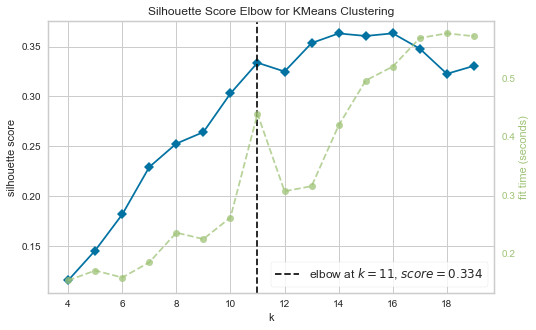


*Fonction by Sandy M.*

In [9]:
pif_kmeans(X_sc, 'silhouette',(4, 20))

Le nombre optimal de k a l'air d'être 12 sur cette représentation.

Le score silhouette pour chaque point est normalisée par la valeur maximale. Nous obtenons ainsi un score compris entre -1 et 1. Ceci permet d'évaluer l'efficacité de la séparation des points en différents clusters et de distinguer la proportion de points qui ont été attribués au mauvais cluster par l'algorithme. 

Les représentations des scores silhouette pour les différents clusters et pour les différentes valeurs de k sont présentées ci-dessous.


*Fonction by Sandy M.*

Pour un nombre de clusters = 9 , le score Silhouette moyen est : 0.29
Pour un nombre de clusters = 10 , le score Silhouette moyen est : 0.28
Pour un nombre de clusters = 11 , le score Silhouette moyen est : 0.33
Pour un nombre de clusters = 12 , le score Silhouette moyen est : 0.34
Pour un nombre de clusters = 13 , le score Silhouette moyen est : 0.35
Pour un nombre de clusters = 14 , le score Silhouette moyen est : 0.36
Pour un nombre de clusters = 15 , le score Silhouette moyen est : 0.36


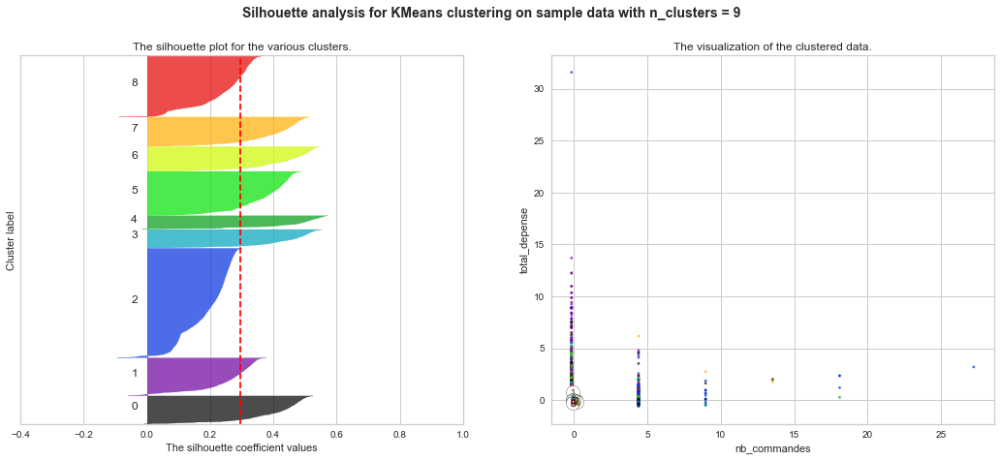

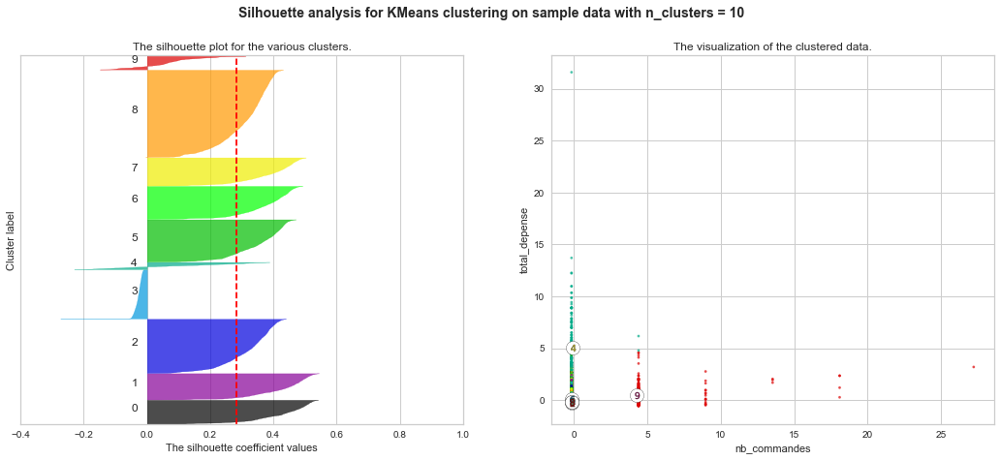

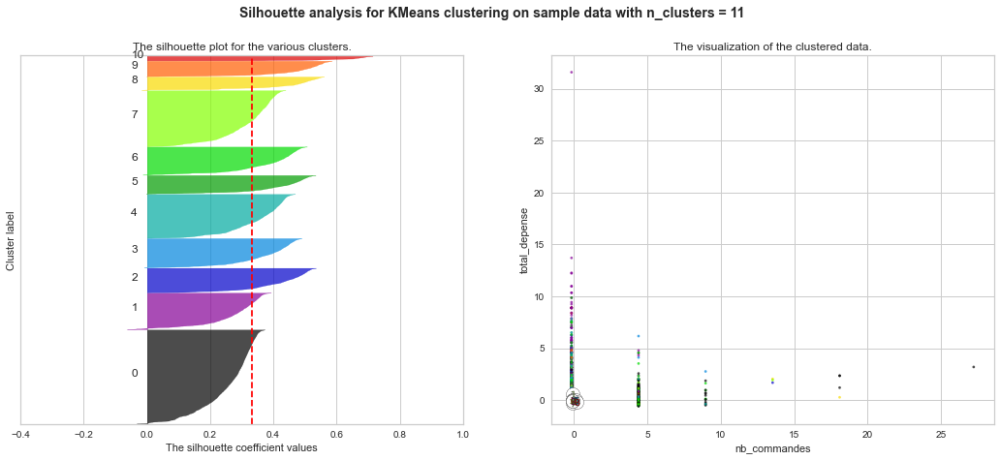

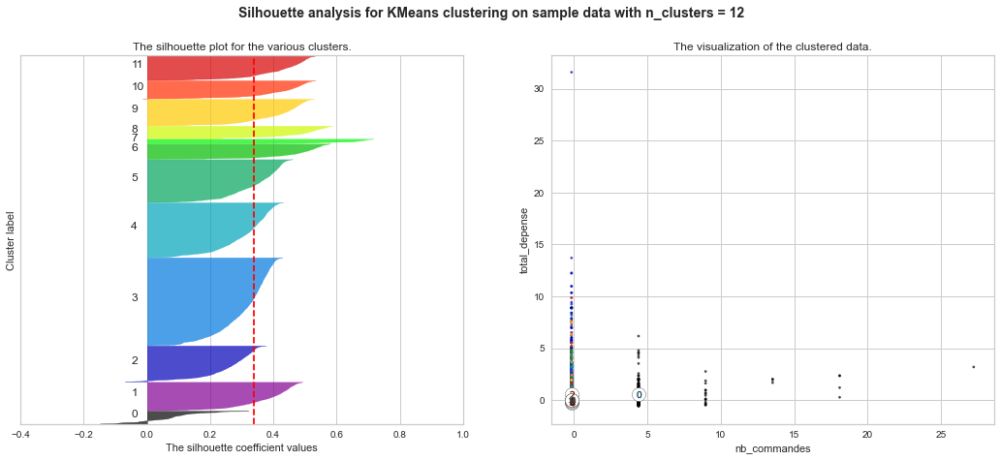

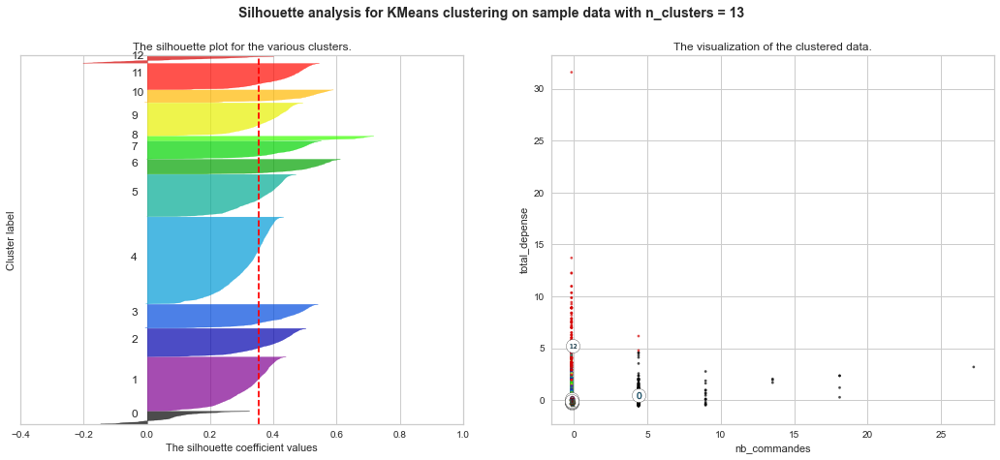

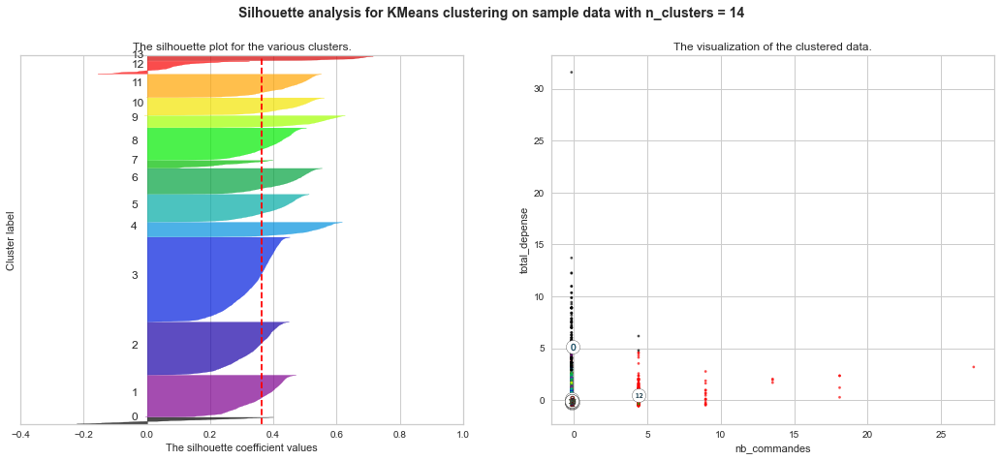

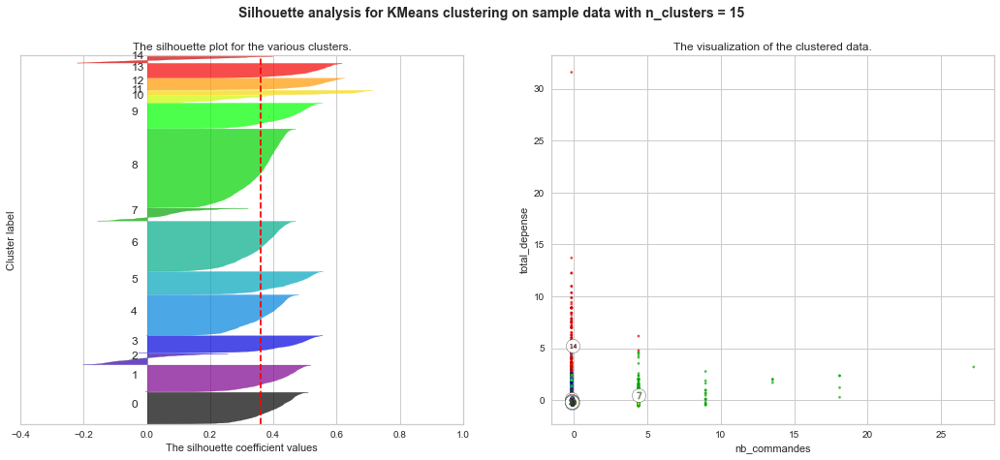

In [10]:
range_n_clusters = [9, 10, 11, 12, 13, 14, 15]

# Cette fonction donne les différents scores silhouette ainsi que les représentations correspondantes
silhou(range_n_clusters, X_sc, 'nb_commandes', 'total_depense')

Prenons l'exemple pour 13 clusters (k). La proportion des groupes est bien réparties excepté pour les 5 derniers groupes. La séparation des clusters est relativement correcte. Quelques erreurs de clusters sont visibles, notamment pour les groupes 8 et 10.  
A droite sont représentées les données selon deux variables (les valeurs sont standardisées). Rien qu'avec ces deux variables il est possible de distinguer 2 groupes, le groupe 10 et le groupe 9, qui correspondent tous les deux à des valeurs atypiques soit pour le montant total des dépenses (groupe 10), soit pour le nombre de commandes (groupe 9).

### L'indice de Calinski-Harabasz

L'indice de Calinski-Harabasz correspond au rapport entre la variance inter-groupes (avec les autres groupes) et la variance intra-groupe (au sein du groupe). Pour que les points d'un même groupe soit les plus similaires possible il faut que la variance intra-groupe soit minimale. Pour que les points de groupes différents soient séparés le plus possible, il faut que la variance inter-groupe soit maximale. Il faut donc que le rapport inter/intra soit le plus grand possible. L'objectif est donc de maximiser l'indice de Calinski-Harabasz.

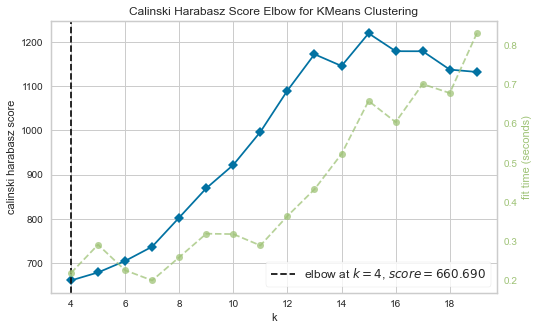


*Fonction by Sandy M.*

In [11]:
pif_kmeans(X_sc, 'calinski_harabasz',(4, 20))

D'après cette représentation, le nombre de k optimal est 14 si l'on s'appuie sur l'indice de Calinski-Harabasz.

### L'indice de Davies-Bouldin

Pour cet indice, plus il est proche de 0, meilleure est la classification.


*Fonction by Sandy M.*

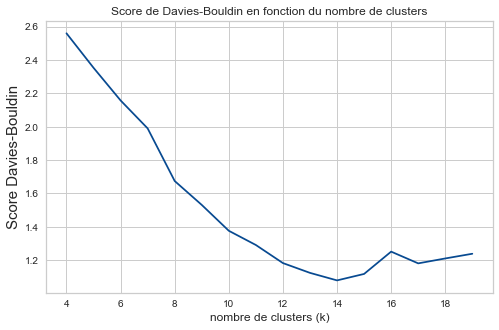

In [12]:
graph_davies_bouldin(X_sc, range(4, 20))

Selon cet indice, le meilleur partitionnement se fait avec 14 groupes.

### Distances intercluster

Nous avons la possibilité de choisir entre les valeurs 12, 13 ou 14 comme nombre de clusters. Une façon de trancher est de regarder la distance entre les différents clusters pour voir s'ils sont correctement séparés.


*Fonction by Sandy M.*

Distance entre les groupes suivant les deux premières composantes principales pour  9 clusters.


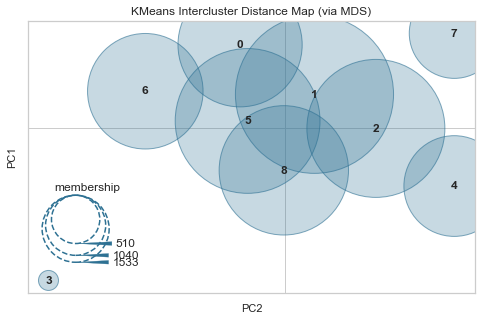

Distance entre les groupes suivant les deux premières composantes principales pour  10 clusters.


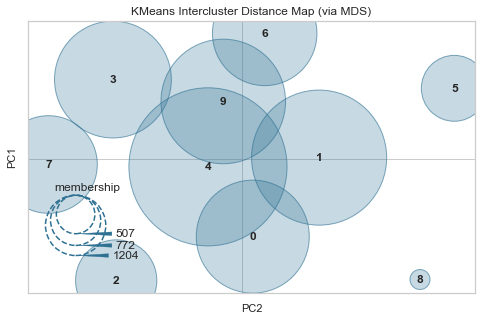

Distance entre les groupes suivant les deux premières composantes principales pour  11 clusters.


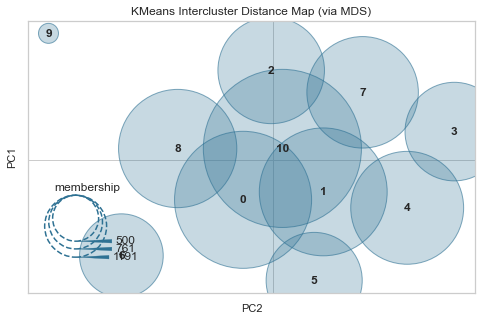

Distance entre les groupes suivant les deux premières composantes principales pour  12 clusters.


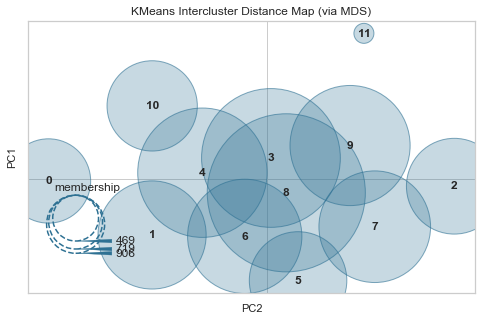

Distance entre les groupes suivant les deux premières composantes principales pour  13 clusters.


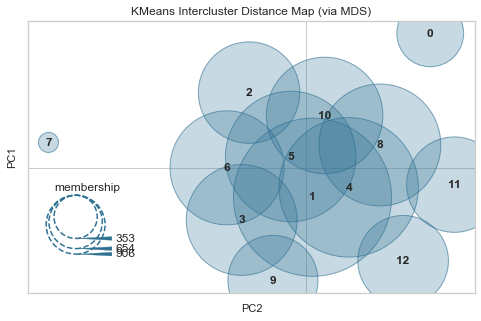

Distance entre les groupes suivant les deux premières composantes principales pour  14 clusters.


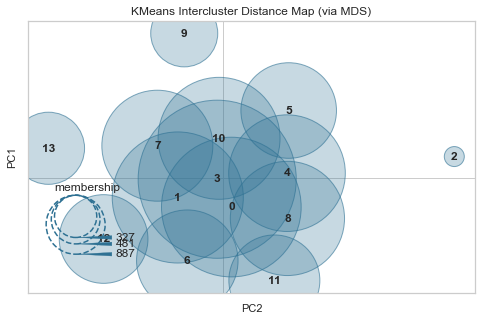

In [13]:
distance_interclusters(X_sc, range(9, 15))

Il est difficile de trancher avec ces représentations. En effet, elles représentent les projections uniquement sur les 2 premières composantes principales.
Dans un premier temps, nous choisissons de garder 12 clusters.

### Identification des clusters

Regardons la répartition des points au sein des différents clusters.

In [14]:
X, kmeans_labels = df_kmeans(X_sc,X,12)

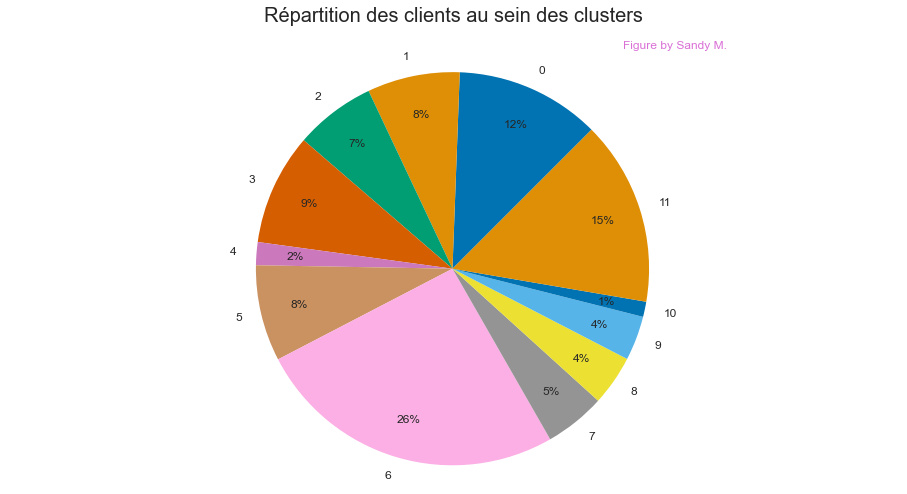

In [15]:
repartition_kmeans(X)

Pour avoir des informations par clusters, on fait la moyenne des informations suivant le numéro du cluster (toujours avec la matrice X, non standardisée) :

Nous faisons la même chose mais cette fois avec une matrice ayant subie une transformation MinMax (pour pouvoir faire une représentation dans un cercle de rayon 1).

In [16]:
X_mm_clusters_moy = df_X_mm_clusters_moy(X, kmeans_labels)
X_mm_clusters_moy

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,autres,cadeaux,denrees_alimentaires,enfants,...,mode,multimedia,produits_culturels,sante_bienetre,sport,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,d_harv
kmeans_label,,,,,,,,,,,,,,,,,,,,,
0,0.004198,0.019146,0.009656,0.095614,0.806465,0.067389,0.001259,0.000000,0.000280,0.000000,...,0.000000,0.000840,0.000420,0.997201,0.000000,0.010457,0.201581,0.017988,0.321536,0.165680
1,0.009417,0.018619,0.020587,0.063741,0.804052,0.068167,0.001314,0.002628,0.000657,0.001314,...,0.000000,0.001752,0.000657,0.005256,0.985107,0.016008,0.208525,0.016191,0.350201,0.165394
2,0.003012,0.019165,0.021084,0.081746,0.809327,0.065928,0.000000,0.001506,0.000000,0.995733,...,0.000000,0.000000,0.002259,0.000000,0.000000,0.009173,0.194261,0.017979,0.386638,0.159558
3,0.002181,0.024133,0.022174,0.103401,0.805389,0.069337,0.000545,0.995911,0.000000,0.000727,...,0.000000,0.001091,0.000364,0.001091,0.000000,0.006940,0.150968,0.023073,0.335479,0.174457
4,0.003527,0.181434,0.029101,0.260409,0.750000,0.077765,0.087302,0.219577,0.000000,0.042328,...,0.005291,0.240741,0.055556,0.079365,0.058201,0.012506,0.047399,0.170768,0.346675,0.209902
5,0.004214,0.017430,0.018963,0.070247,0.783713,0.066474,0.993257,0.001896,0.000000,0.001054,...,0.000632,0.003161,0.000000,0.000000,0.000000,0.012068,0.225782,0.015934,0.326084,0.164032
6,0.010786,0.018040,0.027102,0.096286,0.772211,0.071389,0.001040,0.002557,0.000446,0.002177,...,0.000696,0.002599,0.000879,0.002570,0.002126,0.028744,0.225739,0.014366,0.350958,0.134444
7,0.004333,0.018667,0.022000,0.084739,0.789000,0.070604,0.002000,0.000000,0.000000,0.001000,...,0.000000,0.004500,0.001000,0.000667,0.000000,0.023455,0.229646,0.015885,0.308288,0.151294
8,0.002825,0.015152,0.014528,0.067428,0.816586,0.067983,0.000000,0.000000,0.000000,0.001211,...,0.000000,0.000000,0.995561,0.003228,0.000000,0.009025,0.225711,0.014388,0.312499,0.160494


In [17]:
#Cette fonction permet de représenter les groupes sur un radar de variables
cercle_kmeans(X_mm_clusters_moy, "kmeans_label")


*Figure by Sandy M.*

Ce graphique montre que les variables de catégories de produits ont un poids bien trop important pour la détermination des clusters. Ces variables cachent complètement les autres variables. Il faut trouver une solution pour que les variables de catégories aient une influence beaucoup moins forte sur la détermination des clusters.

## Méthode des K-means avec la base de données sans les variables de catégories de produits

### Modifications des variables de catégories de produits

Nous allons remplacer les variables de catégories de produits par une variable qui recense le nombre de catégories de produits différentes pour un client.

In [18]:
col_cats = [
    'cadeaux', 'denrees_alimentaires', 'enfants', 'maison_intérieur', 'mode',
    'multimedia', 'autres', 'produits_culturels', 'sante_bienetre', 'sport',
    'matériaux_outils'
    ]

df_ss_cat = df_nb_categories(df, col_cats)

df_ss_cat

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,Etat_geo_client,d_harv,cat_differentes
0,1,129.90,1.0,8.0,5.0,6.0,1.0,0.08,129.90,111,São Paulo,30.784607,1
1,1,18.90,1.0,1.0,4.0,3.0,1.0,0.30,18.90,114,São Paulo,15.709783,1
2,1,69.00,1.0,8.0,3.0,26.0,1.0,0.20,69.00,537,Santa Catarina,487.145776,1
3,1,25.99,1.0,4.0,4.0,20.0,1.0,0.40,25.99,321,Pará,2480.782824,1
4,1,180.00,1.0,6.0,5.0,13.0,1.0,0.09,180.00,288,São Paulo,85.358407,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93098,1,1570.00,1.0,10.0,5.0,28.0,2.0,0.24,785.00,447,Pernambuco,2000.688657,1
93099,1,64.89,1.0,1.0,4.0,30.0,1.0,0.23,64.89,262,Bahia,1498.216599,1
93100,1,89.90,1.0,1.0,5.0,15.0,1.0,0.20,89.90,568,Mato Grosso,1605.208311,1
93101,1,115.00,1.0,5.0,5.0,12.0,1.0,0.14,115.00,119,Espírito Santo,576.978793,1


In [19]:
# Cette fonction retourne une base de données quantitative standardisée
X, X_sc = stdX(df_ss_cat)


*Fonction by Sandy M.*

### La méthode du coude

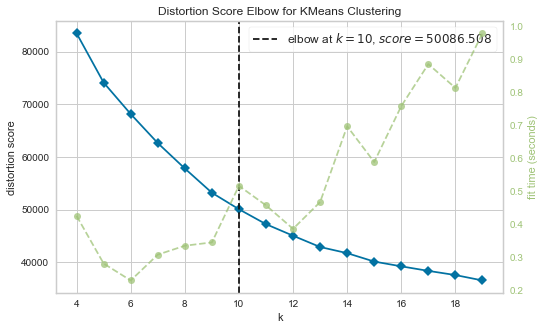


*Fonction by Sandy M.*

In [20]:
pif_kmeans(X_sc, 'distortion',(4, 20))

En suivant la méthode du coude, le nombre k choisi est celui à partir duquel la variance (distortion sur le graphique, par défaut, le métrique est "distortion") ne se réduit plus de façon significative. Sur ce graphique il se trouve à 11 .

### Silhouette

Le partitionnement optimal sera pour le k qui correspondra au coefficient de silhouette le plus élevé.

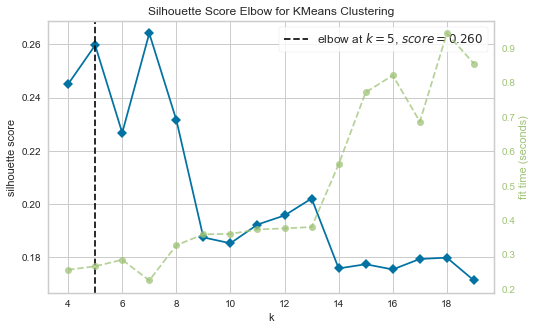


*Fonction by Sandy M.*

In [21]:
pif_kmeans(X_sc, 'silhouette',(4, 20))

Le nombre optimal de k a l'air d'être 5 sur cette représentation. Nous remarquons que les scores silhouette sont moins élevés que pour le cas précédent.

Le score silhouette pour chaque point est normalisé par la valeur maximale. Nous obtenons ainsi un score compris entre -1 et 1. Ceci permet d'évaluer l'efficacité de la séparation des points en différents clusters et de distinguer la proportion de points qui ont été attribués au mauvais cluster par l'algorithme. 

Les représentations des scores silhouette pour les différents clusters et pour les différentes valeurs de k sont présentées ci-dessous.


*Fonction by Sandy M.*

Pour un nombre de clusters = 4 , le score Silhouette moyen est : 0.24
Pour un nombre de clusters = 5 , le score Silhouette moyen est : 0.26
Pour un nombre de clusters = 6 , le score Silhouette moyen est : 0.22
Pour un nombre de clusters = 7 , le score Silhouette moyen est : 0.23
Pour un nombre de clusters = 8 , le score Silhouette moyen est : 0.23
Pour un nombre de clusters = 9 , le score Silhouette moyen est : 0.19
Pour un nombre de clusters = 10 , le score Silhouette moyen est : 0.19


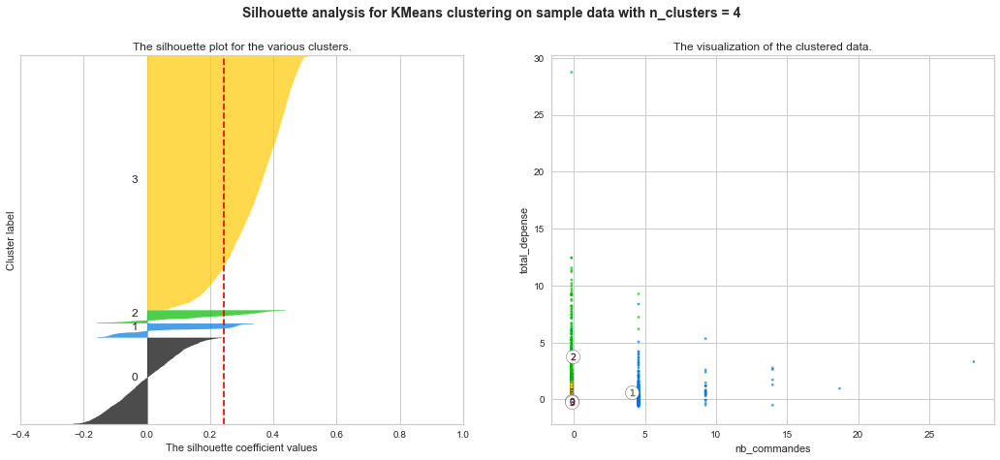

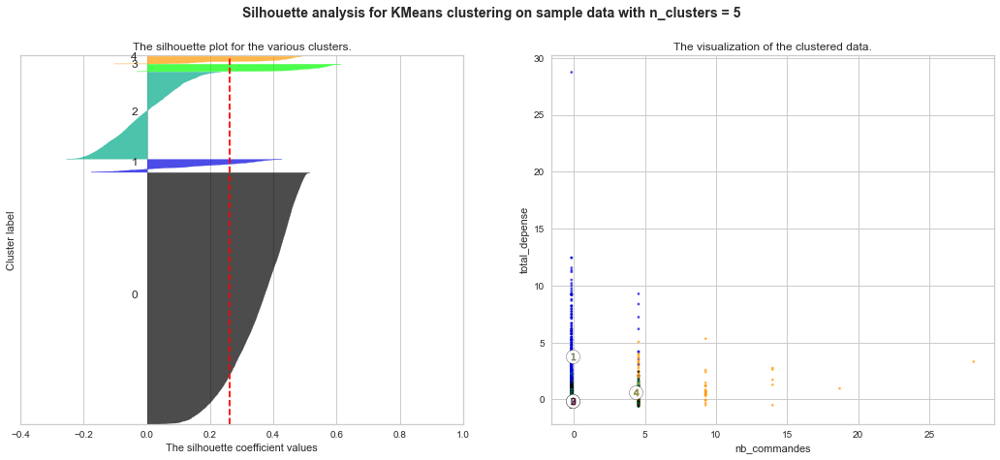

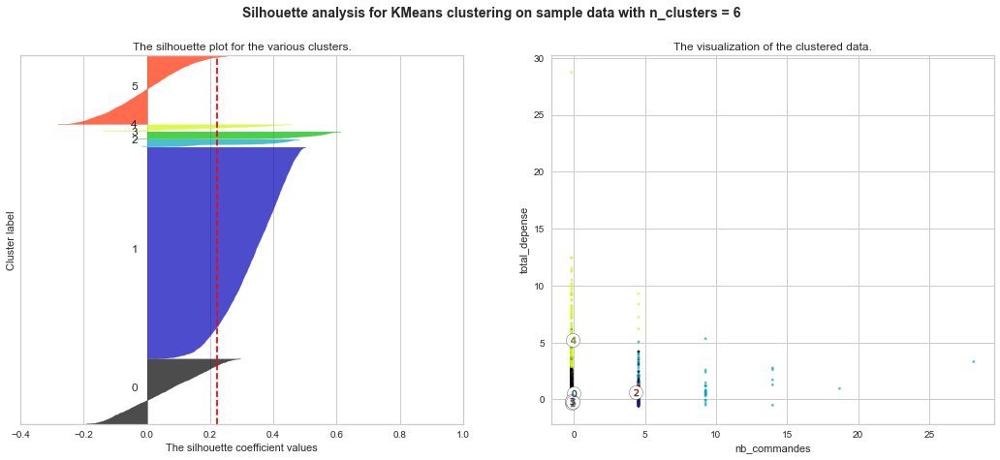

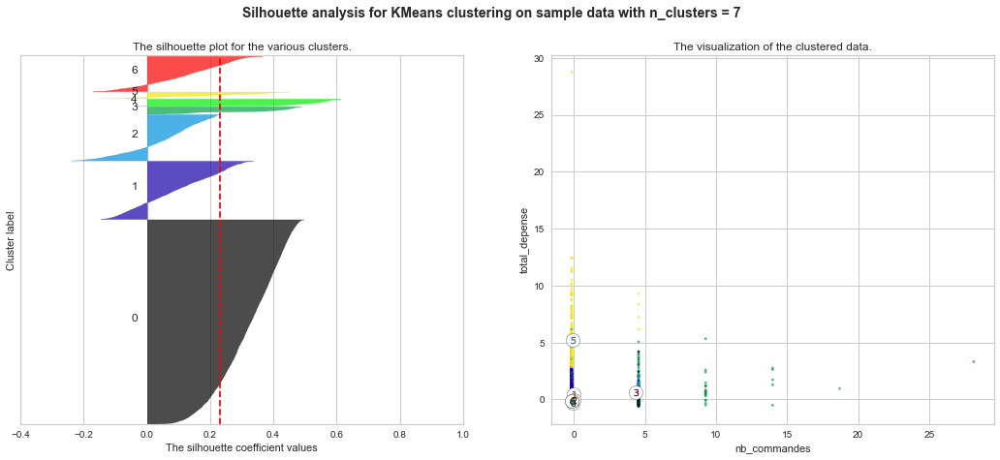

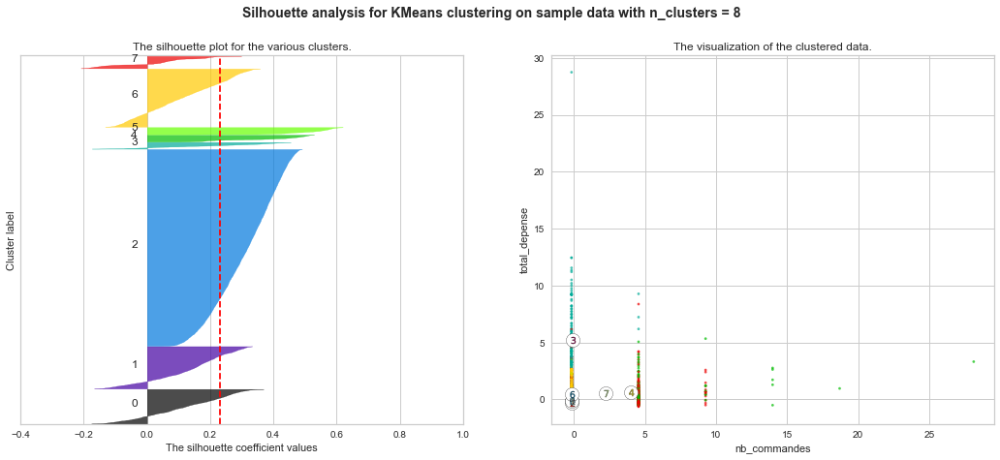

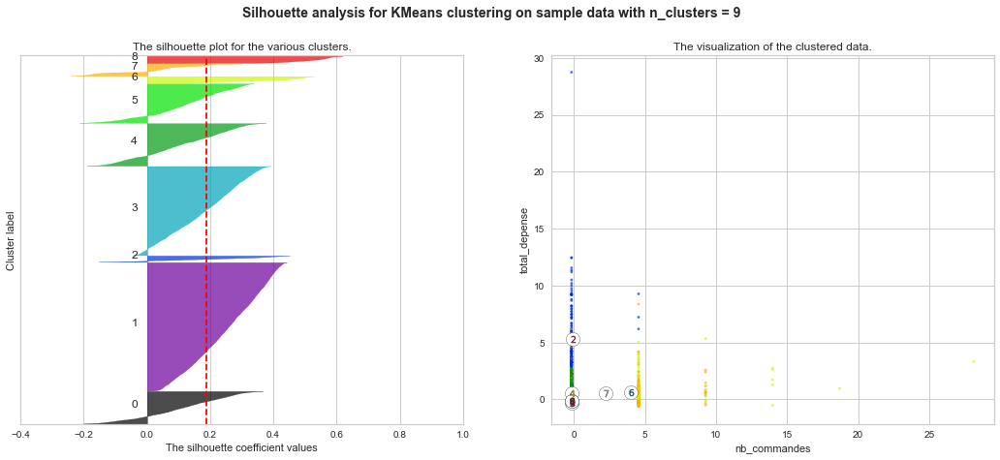

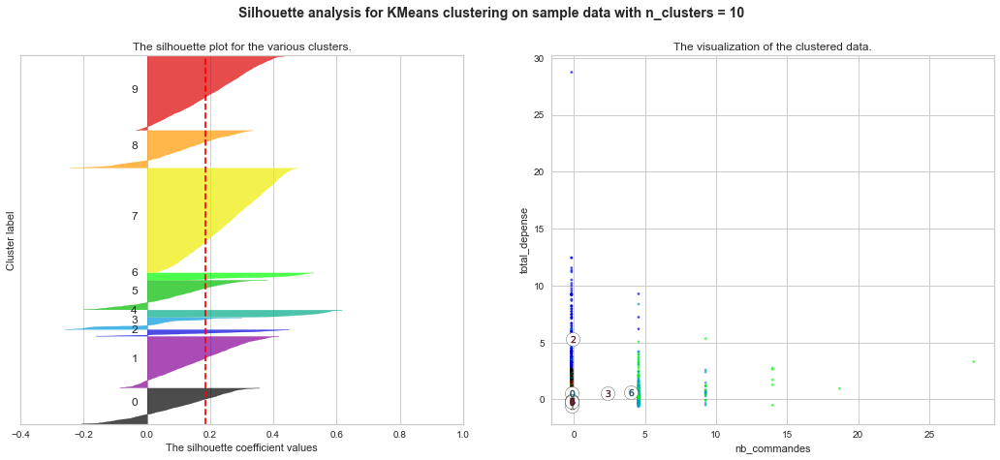

In [22]:
range_n_clusters = [4, 5, 6, 7, 8, 9, 10]

# Cette fonction donne les différents scores silhouette ainsi que les représentations correspondantes
silhou(range_n_clusters, X_sc, 'nb_commandes', 'total_depense')

Prenons l'exemple pour 6 clusters (k). La proportion des groupes est bien répartie excepté pour les  groupes 3, 4 et 5. La séparation des clusters est relativement correcte. Quelques erreurs de clusters sont visibles, notamment pour les groupes 0, 1, 3 et 5.  
A droite sont représentées les données selon deux variables (les valeurs sont standardisées). Rien qu'avec ces deux variables il est possible de distinguer 2 groupes, le groupe 5 et le groupe 3, qui correspondent tous les deux à des valeurs atypiques soit pour le montant total des dépenses (groupe 5), soit pour le nombre de commandes (groupe 3).

### L'indice de Calinski-Harabasz

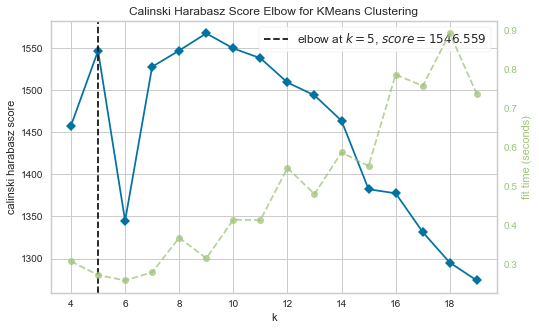


*Fonction by Sandy M.*

In [23]:
pif_kmeans(X_sc, 'calinski_harabasz',(4, 20))

D'après cette représentation, le nombre de k optimal est 5 si l'on s'appuie sur l'indice de Calinski-Harabasz.

### L'indice de Davies-Bouldin

Pour cet indice, plus il est proche de 0, meilleure est la classification.


*Fonction by Sandy M.*

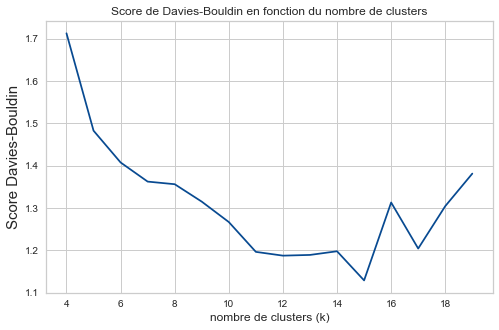

In [24]:
graph_davies_bouldin(X_sc, range(4, 20))

Si nous nous basons sur cet indice, le nombre optimal de cluster est 6.

### Distances intercluster

Nous avons la possibilité de choisir entre les valeurs entre 5 et 9 comme nombre de clusters. Une façon de trancher est de regarder la distance entre les différents clusters pour voir s'ils sont correctement séparés.


*Fonction by Sandy M.*

Distance entre les groupes suivant les deux premières composantes principales pour  5 clusters.


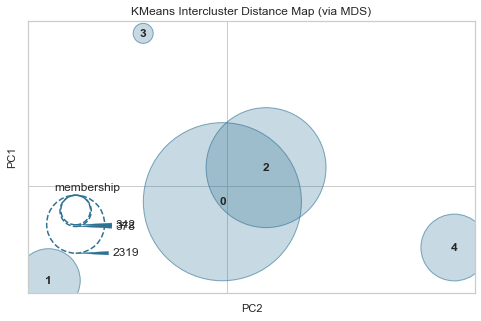

Distance entre les groupes suivant les deux premières composantes principales pour  6 clusters.


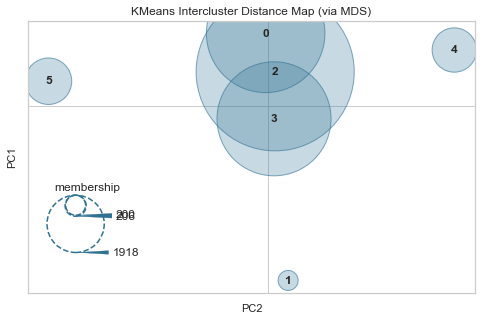

Distance entre les groupes suivant les deux premières composantes principales pour  7 clusters.


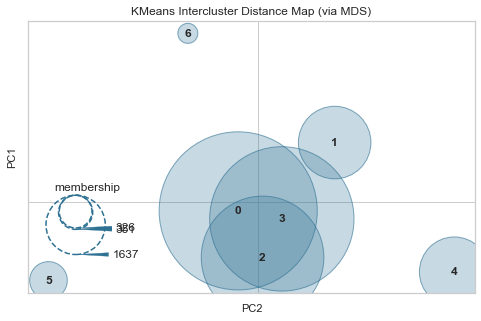

Distance entre les groupes suivant les deux premières composantes principales pour  8 clusters.


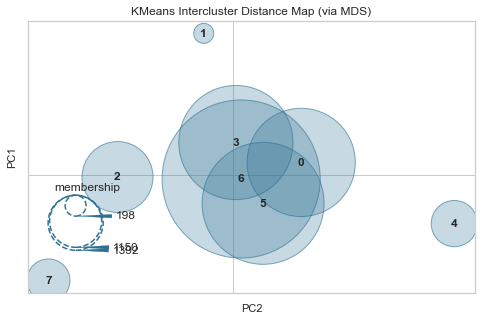

Distance entre les groupes suivant les deux premières composantes principales pour  9 clusters.


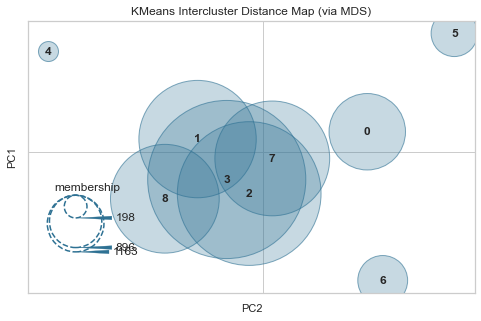

In [25]:
distance_interclusters(X_sc, range(5, 10))

Il est difficile de trancher avec ces représentations. En effet, elles représentent les projections uniquement sur les 2 premières composantes principales.
Dans un premier temps, nous choisissons de garder 8 clusters.

### Identification des clusters

In [26]:
X, kmeans_labels = df_kmeans(X_sc,X,8)

Regardons la répartition des points au sein des différents clusters.

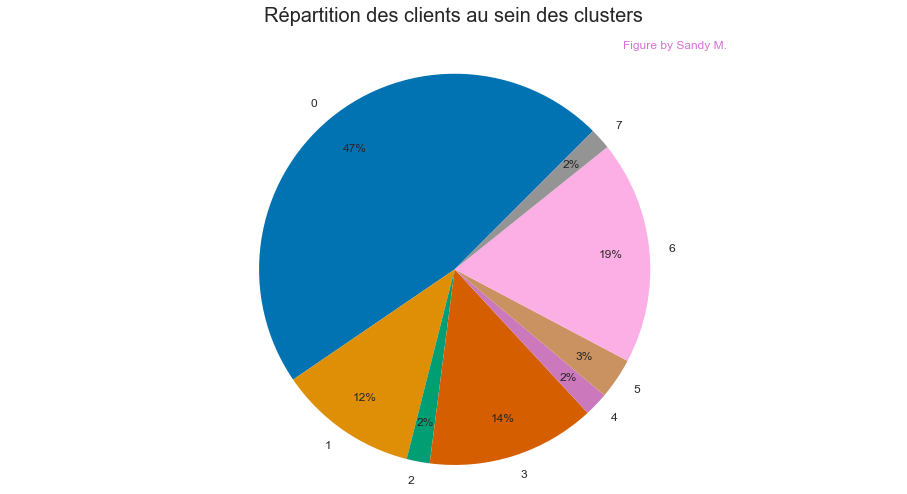

In [27]:
repartition_kmeans(X)

Pour avoir des informations par clusters, on fait la moyenne des informations suivant le numéro du cluster (toujours avec la matrice X, non standardisée) :

In [28]:
X_mm_clusters_moy = df_X_mm_clusters_moy(X, kmeans_labels)
X_mm_clusters_moy

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,d_harv,cat_differentes
kmeans_label,,,,,,,,,,,,
0,0.000000,0.016319,0.000000,0.035500,0.906974,0.038242,0.006332,0.204872,0.034958,0.309374,0.077522,0.000000
1,0.000145,0.019744,0.000000,0.066678,0.120009,0.103232,0.020255,0.254061,0.039014,0.338314,0.180788,0.000000
2,0.148342,0.043850,0.018470,0.100421,0.763918,0.048509,0.161722,0.235415,0.040224,0.304961,0.147136,0.347295
3,0.000000,0.039953,0.000000,0.260798,0.865578,0.053556,0.008455,0.142079,0.085848,0.395650,0.200729,0.000000
4,0.000842,0.020055,1.000000,0.110269,0.767992,0.055066,0.020202,0.259861,0.040465,0.339234,0.157526,0.005051
5,0.084320,0.041594,0.010848,0.097972,0.716836,0.049874,0.241617,0.276803,0.030005,0.323226,0.135835,0.000000
6,0.000000,0.007845,0.000000,0.036532,0.885135,0.066481,0.006847,0.440914,0.016623,0.387736,0.297172,0.000000
7,0.002857,0.204330,0.014286,0.235476,0.765000,0.065632,0.013968,0.052993,0.425649,0.352140,0.203514,0.000000


Nous faisons la même chose mais cette fois avec une matrice ayant subie une transformation MinMax (pour pouvoir faire une représentation dans un cercle de rayon 1).

In [29]:
#Cette fonction permet de représenter les groupes sur un radar de variables
cercle_kmeans(X_mm_clusters_moy, "kmeans_label")


*Figure by Sandy M.*

Nous faisons un tableau de contingence des variables selon leur quartile d'appartenance pour la variable en question.


*Table by Sandy M.*

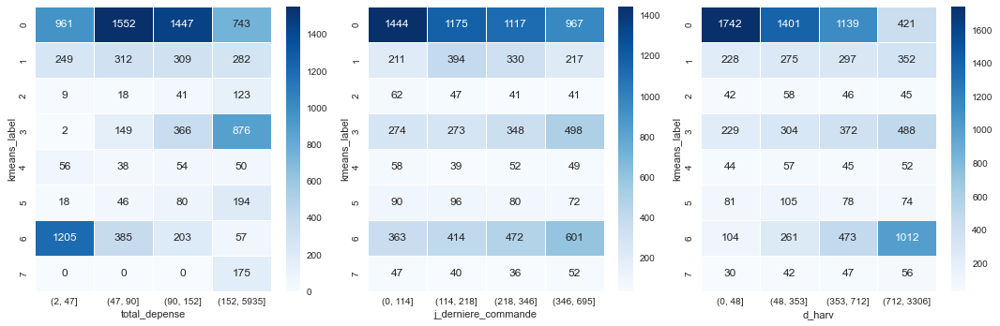

In [30]:
colonnes = ['total_depense', 'j_derniere_commande', 'd_harv']
table_cont(X,'kmeans_label',colonnes)

Une façon synthétique de voir la répartition des différents groupes au sein de la distribution des variables est de faire un tableau qui récapitule la différence relative des moyennes d'un groupe par rapport à l'ensemble des points, pour une variable donnée.


*Table by Sandy M.*

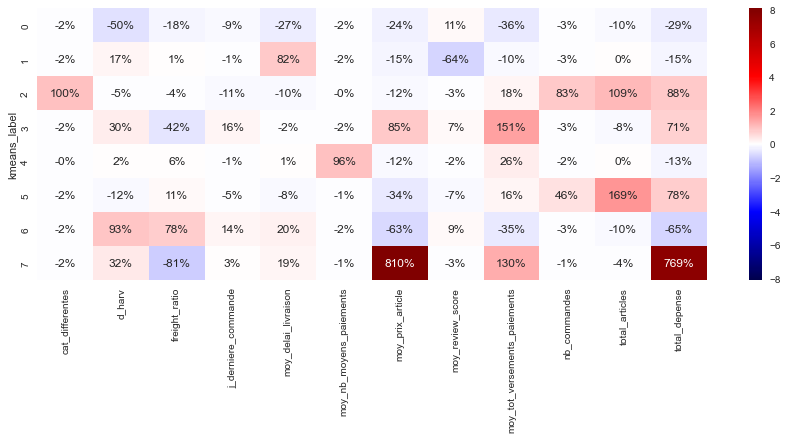

In [31]:
table_mean(X, 'kmeans_label')

Cette fois-ci les clusters sont un peu plus faciles à identifier.


Cluster 0 : Clients qui payent en plusieurs fois.

Cluster 1 : Clients mécontents.

Cluster 2 : Clients qui ont fait une commande récemment.

Cluster 3 : Même profil que le cluster 2, mais ils ont payé en une fois.

Cluster 4 : Même profil que le groupe 5, mais plus proches de Sao Paolo

Cluster 5 : Les clients éloignés de Sao Paolo

Cluster 6 : Clients qui achètent pour des sommes plus importantes que les autres clients.

Cluster 7 : Clients qui achètent des articles dans différentes catégories de produits.

Nous remarquons que plusieurs groupes sont difficiles à identifier. Essayons de trouver une méthode qui permette d'affiner notre partitionnement et d'obtenir des clusters avec des attributs un peu plus clairs.

## Méthode des K-means avec les nouvelles composantes principales

In [32]:
col_cats = [
    'cadeaux', 'denrees_alimentaires', 'enfants', 'maison_intérieur', 'mode',
    'multimedia', 'autres', 'produits_culturels', 'sante_bienetre', 'sport',
    'matériaux_outils'
    ]

df_ss_cat = df_nb_categories(df, col_cats)

df_ss_cat

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,Etat_geo_client,d_harv,cat_differentes
0,1,129.90,1.0,8.0,5.0,6.0,1.0,0.08,129.90,111,São Paulo,30.784607,1
1,1,18.90,1.0,1.0,4.0,3.0,1.0,0.30,18.90,114,São Paulo,15.709783,1
2,1,69.00,1.0,8.0,3.0,26.0,1.0,0.20,69.00,537,Santa Catarina,487.145776,1
3,1,25.99,1.0,4.0,4.0,20.0,1.0,0.40,25.99,321,Pará,2480.782824,1
4,1,180.00,1.0,6.0,5.0,13.0,1.0,0.09,180.00,288,São Paulo,85.358407,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93098,1,1570.00,1.0,10.0,5.0,28.0,2.0,0.24,785.00,447,Pernambuco,2000.688657,1
93099,1,64.89,1.0,1.0,4.0,30.0,1.0,0.23,64.89,262,Bahia,1498.216599,1
93100,1,89.90,1.0,1.0,5.0,15.0,1.0,0.20,89.90,568,Mato Grosso,1605.208311,1
93101,1,115.00,1.0,5.0,5.0,12.0,1.0,0.14,115.00,119,Espírito Santo,576.978793,1


In [33]:
# Cette fonction retourne une base de données quantitative standardisée
X, X_sc = stdX(df_ss_cat)


*Fonction by Sandy M.*

### Analyse Descriptive : Analyse en composantes principales (ACP)

L'analyse en composantes principales (ACP) a deux objectifs principaux :
- étudier la liaison entre les variables
- étudier la variabilité entre individus.
Le premier objectif consiste à interpréter le cercle des corrélations et de calculer les composantse principales.

In [34]:
data_pca = df_ss_cat.copy(deep=True)
data_pca = data_pca.sample(10000)
print(
    f"La base de données contient {data_pca.select_dtypes(exclude=object).shape[1]} variables quantitatives"
)

La base de données contient 12 variables quantitatives


Avant de représenter les cercles de corrélations pour les différents couples d'axes principaux d'inertie, il faut connaître le nombre de composantes principales optimales.
Pour cela, la fonction ACP est utilisée pour le nombre total de variables quantitatives de la base de données. Pour avoir accès au nombre de composantes principales optimal il suffit de représenter l'éboulis des valeurs propres. Si le ratio d'inertie est inférieur à p/100 (où p est le nombre de variables quantitatives), cela signifie que l'axe principal d'inertie a moins de variabilité que la variable initiale (c'est le critère de Kaiser). Dans le cas de cette base de données, le nombre de composantes principales optimal est 8. Il s'agit d'un bon compromis entre le critère de kaiser qui donne 5 et le fait que pour atteindre une inertie de près de 90% il faut 10 composantes principales.

In [35]:
pca, data_compo, n_comp, X_projected, names = maPCA(
    data_pca,
    data_pca.select_dtypes(exclude=object).shape[1])


*Fonction by Sandy M.*


*Fonction by Sandy M.*

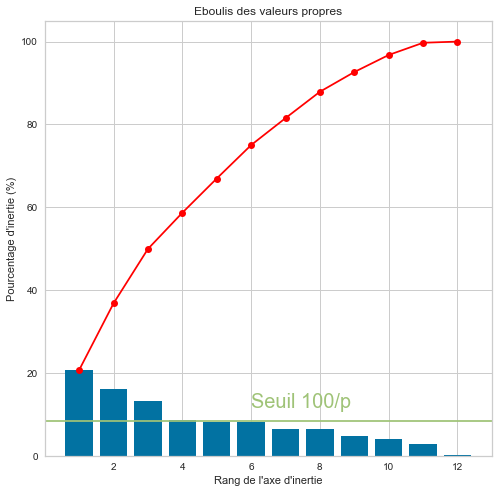

D'après le critère de Kaiser, il y a 4 composantes principales optimales (avec un pourcentage d'inertie supérieur au seuil de 100/p).


In [36]:
eboulis(pca, data_pca.select_dtypes(exclude=object).shape[1], n_comp)

Une fois le nombre de composantes principales optimal déterminé, il suffit d'appliquer à nouveau la fonction de l'ACP. Elle donne un tableau avec les coefficients de chaque composante principale.


*Fonction by Sandy M.*

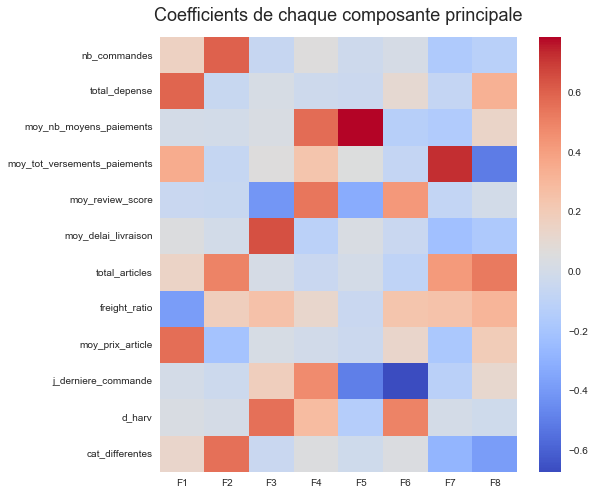

In [37]:
pca, data_compo, n_comp, X_projected, names = maPCA(data_pca, 8)

La fonction de l'ACP donne également le tableau de valeur selon les nouvelles "variables" que sont les composantes principales.

In [38]:
data_compo.head(2)

,F1,F2,F3,F4,F5,F6,F7,F8
58043,-0.049898,-0.444023,-1.795762,-0.524422,0.290707,0.373294,-0.238800,-0.241459
50757,1.425400,6.822478,-0.238549,1.064910,-0.938012,0.269897,-2.247955,-2.369113


Les cercles des corrélations permettent de visualiser les corrélations entre les variables et les axes principaux d'inertie. Dans le cas de cette étude, l'analyse est une ACP normée, les axes vont donc de la valeur -1 à la valeur 1 et les flèches les plus faciles à interpréter sont celles dont la pointe est proche du cercle des corrélations.

Dans le cas de cette étude, par exemple la composante F3 représente la distance des clients par rapport à Sao Paolo. La composante principale F1 représente les grandes dépenses.


*Fonction by Sandy M.*

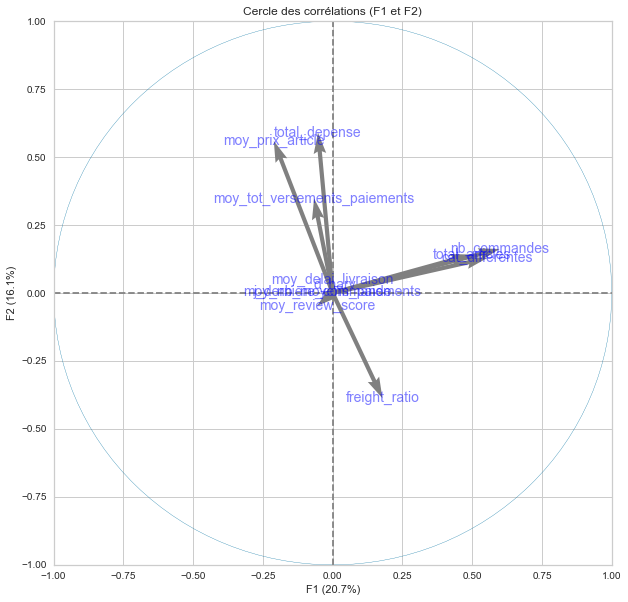

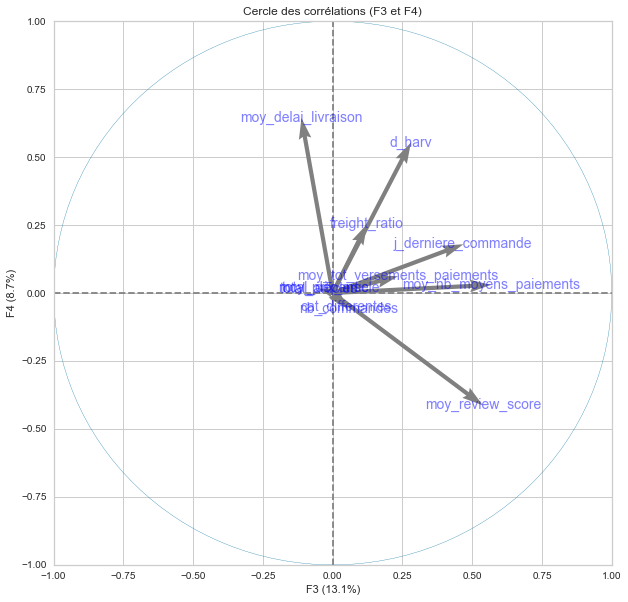

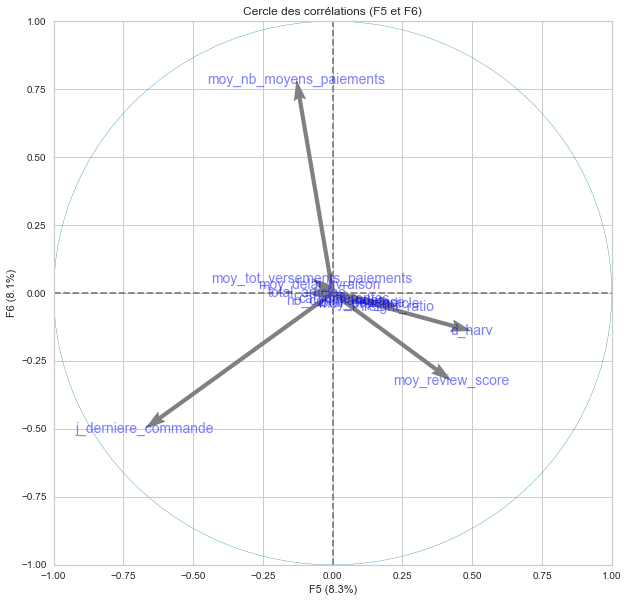

In [39]:
features = data_pca.select_dtypes(exclude=object).columns
display_circles(n_comp,
                    pca, [(0, 1), (2, 3), (4, 5)],
                    labels=np.array(features))

Enfin il est possible de représenter les produits sur les graphiques avec comme axes les composantes principales. Cela permet de voir s'il est possible de dégager des tendances ou des groupes suivant ces nouvelles "variables".


*Fonction by Sandy M.*

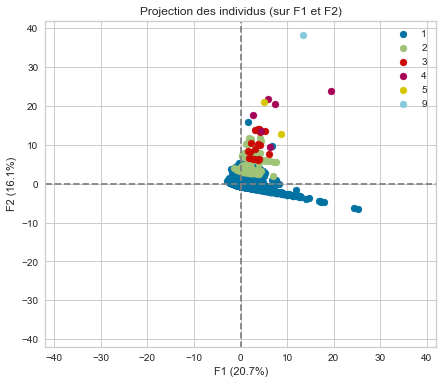

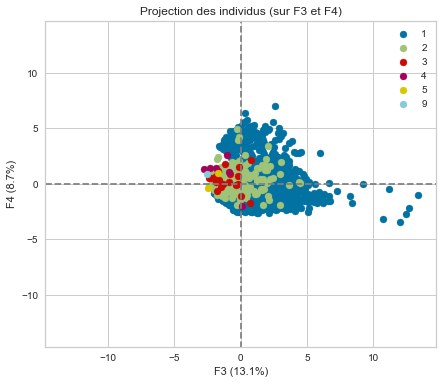

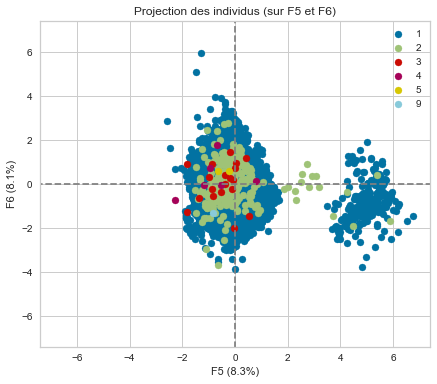

In [40]:
display_factorial_planes(X_projected,
                             n_comp,
                             pca, [(0, 1), (2, 3), (4, 5)],
                             illustrative_var=data_pca['nb_commandes'])

### La méthode du coude

In [41]:
# Cette fonction retourne une base de données quantitative standardisée
X, X_sc = stdX(df_ss_cat)


*Fonction by Sandy M.*

In [42]:
pca = PCA(n_components=8)
X_sc = pd.DataFrame(pca.fit_transform(X_sc),
                    index=X_sc.index,
                    columns=['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8'])

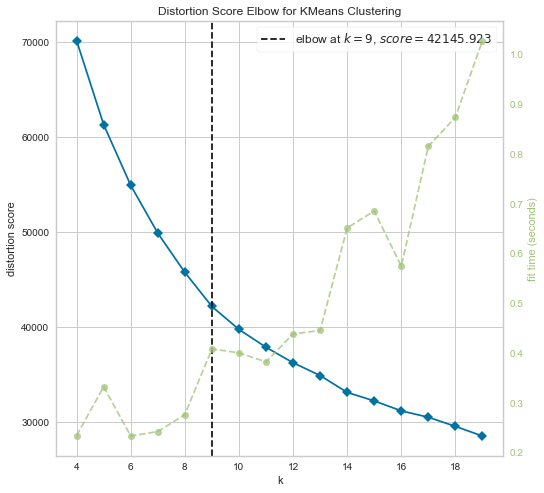


*Fonction by Sandy M.*

In [43]:
pif_kmeans(X_sc, 'distortion',(4, 20))

En suivant la méthode du coude, le nombre k choisi est celui à partir duquel la variance (distortion sur le graphique, par défaut, le metrique est "distortion") ne se réduit plus de façon significative. Sur ce graphique il se trouve à 10 .

### Silhouette

Le partitionnement optimal sera pour le k qui correspondra au coefficient de silhouette le plus élevé.

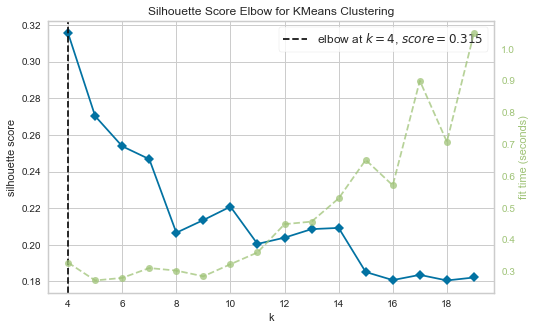


*Fonction by Sandy M.*

In [44]:
pif_kmeans(X_sc, 'silhouette',(4, 20))

Le nombre optimal de k a l'air d'être 4 sur cette représentation. Nous remarquons que les scores silhouette sont moins élevés que pour le cas précédent.

Le score silhouette pour chaque point est normalisée par la valeur maximale. Nous obtenons ainsi un score compris entre -1 et 1. Ceci permet d'évaluer l'efficacité de la séparation des points en différents clusters et de distinguer la proportion de points qui ont été attribués au mauvais cluster par l'algorithme. 

Les représentations des scores silhouette pour les différents clusters et pour les différentes valeurs de k sont présentées ci-dessous.


*Fonction by Sandy M.*

Pour un nombre de clusters = 4 , le score Silhouette moyen est : 0.32
Pour un nombre de clusters = 5 , le score Silhouette moyen est : 0.27
Pour un nombre de clusters = 6 , le score Silhouette moyen est : 0.25
Pour un nombre de clusters = 7 , le score Silhouette moyen est : 0.25
Pour un nombre de clusters = 8 , le score Silhouette moyen est : 0.21
Pour un nombre de clusters = 9 , le score Silhouette moyen est : 0.21
Pour un nombre de clusters = 10 , le score Silhouette moyen est : 0.22


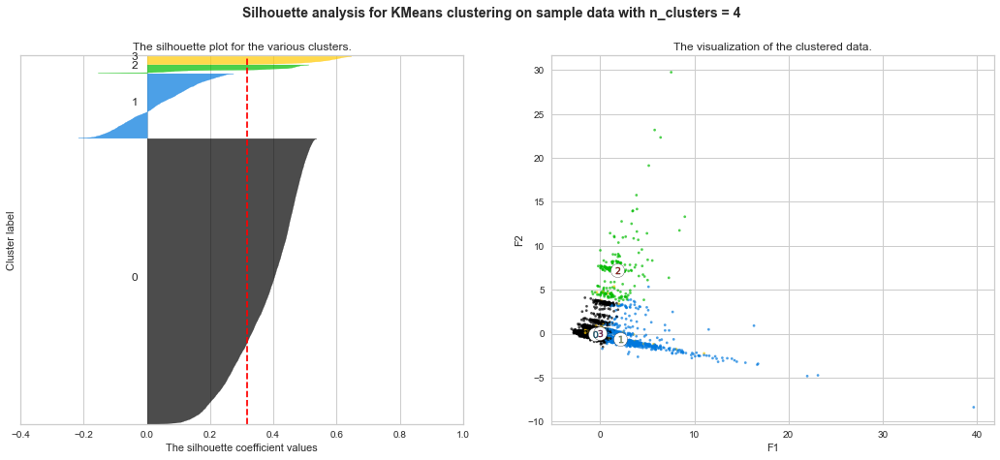

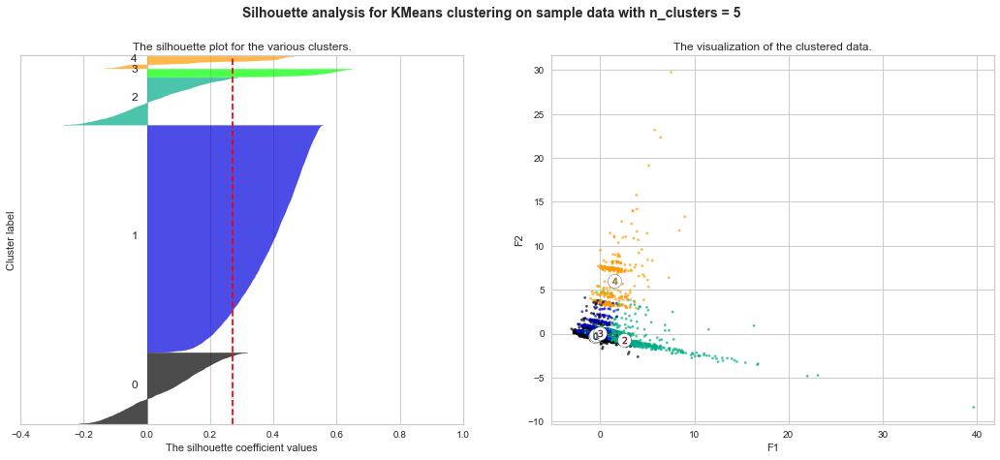

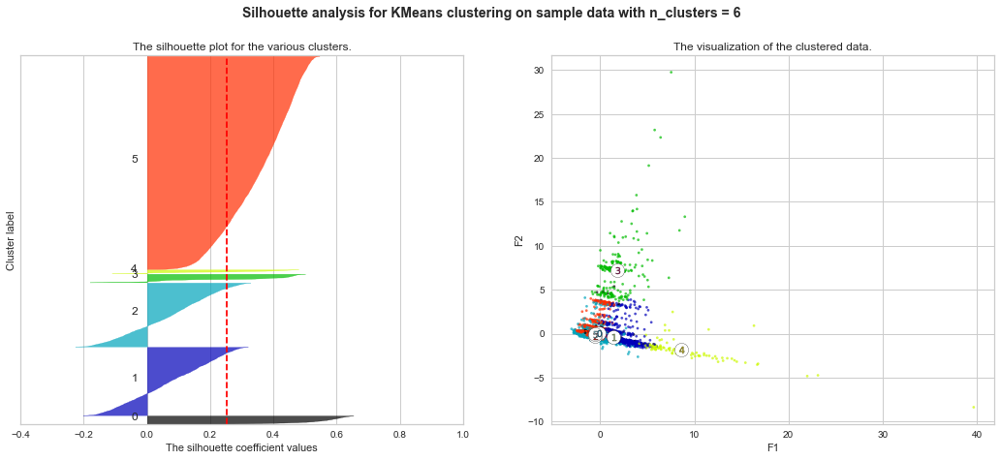

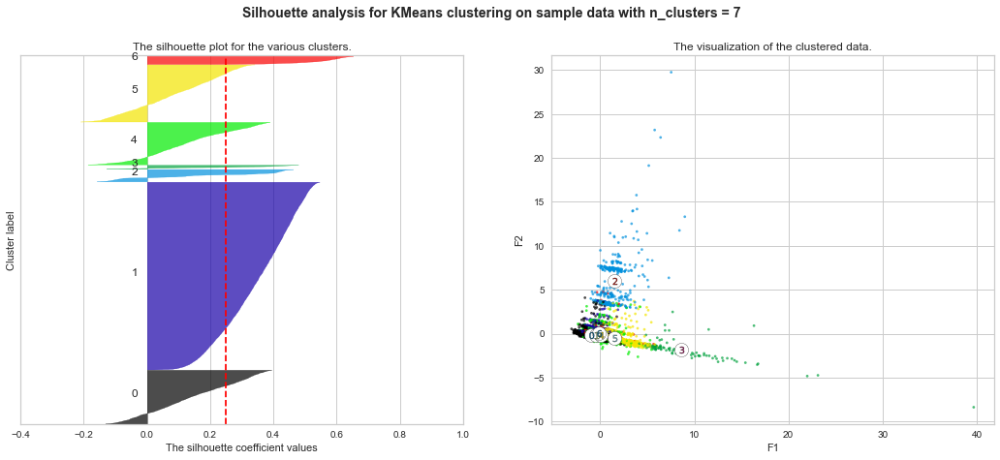

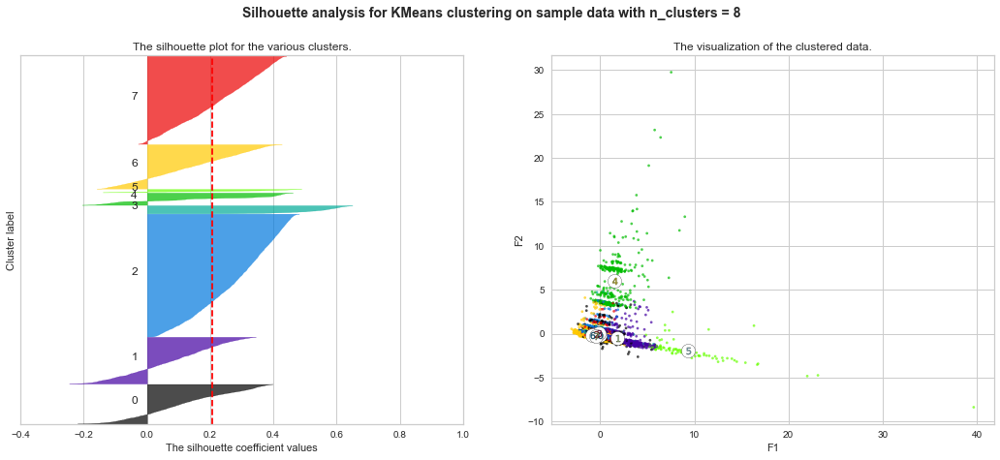

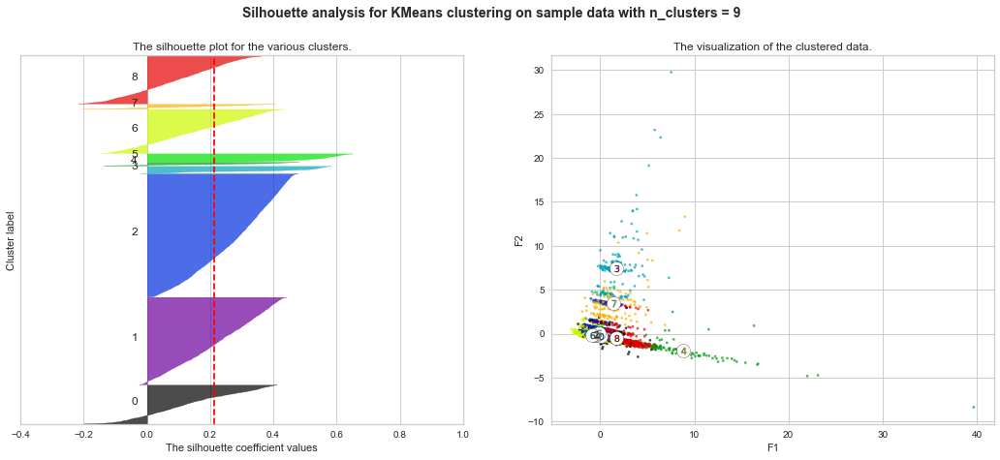

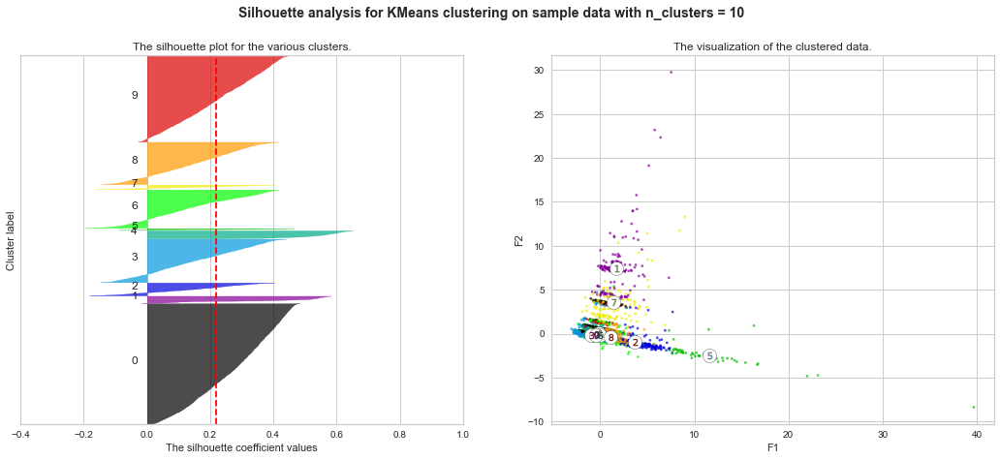

In [45]:
range_n_clusters = [4, 5, 6, 7, 8, 9, 10]

# Cette fonction donne les différents scores silhouette ainsi que les représentations correspondantes
silhou(range_n_clusters, X_sc, 'F1', 'F2')

Avec la PCA avant l'algorithme des k-means, les groupes sont plus faciles à visualiser. Prenons l'exemple pour 6 clusters (k). La proportion des groupes est bien réparties excepté pour les  groupes 1, 3 et 5. La séparation des clusters est relativement correctes. Quelques erreurs de clusters sont visibles, notamment pour les groupes 1, 3 et 4.  
A droite sont représentées les données selon deux composantes principales. Il est possible de distinguer 2 groupes, le groupe 1 et le groupe 3.

### L'indice de Calinski-Harabasz

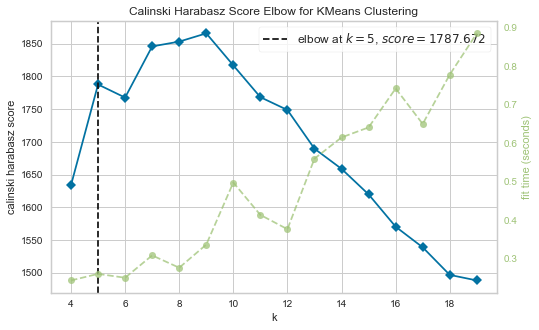


*Fonction by Sandy M.*

In [46]:
pif_kmeans(X_sc, 'calinski_harabasz',(4, 20))

D'après cette représentation, le nombre de k optimal est 5 si l'on s'appuie sur l'indice de Calinski-Harabasz.

### L'indice de Davies-Bouldin

Pour cet indice, plus il est proche de 0, meilleure est la classification.


*Fonction by Sandy M.*

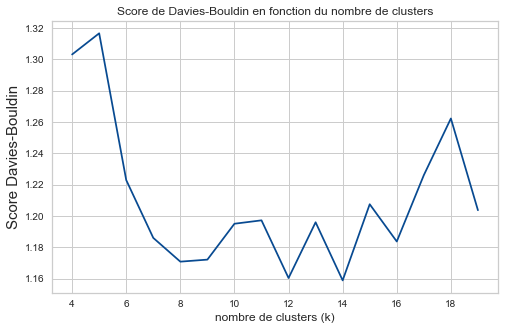

In [47]:
graph_davies_bouldin(X_sc, range(4, 20))

D'après cet indice, le nombre de clusters optimal est de 7 ou 10.

### Distances intercluster

Nous avons la possibilité de choisir entre les valeurs entre 6 et 8 comme nombre de clusters. Une façon de trancher est de regarder la distance entre les différents clusters pour voir s'ils sont correctement séparés.


*Fonction by Sandy M.*

Distance entre les groupes suivant les deux premières composantes principales pour  9 clusters.


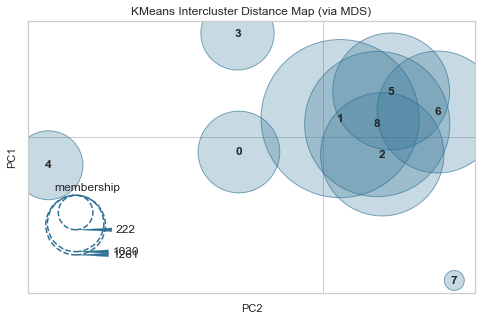

Distance entre les groupes suivant les deux premières composantes principales pour  10 clusters.


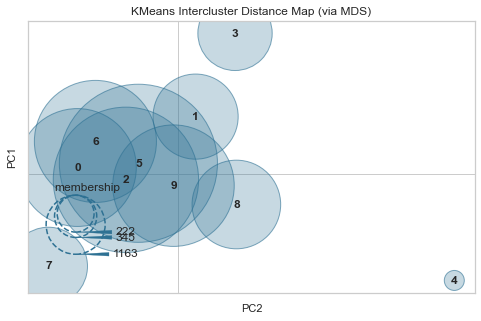

Distance entre les groupes suivant les deux premières composantes principales pour  11 clusters.


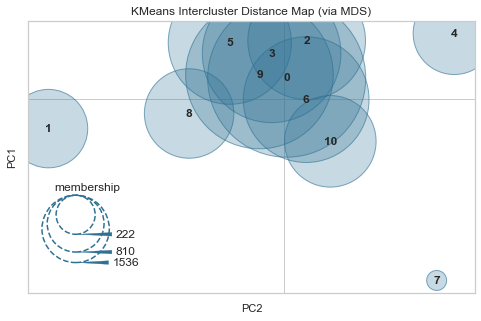

Distance entre les groupes suivant les deux premières composantes principales pour  12 clusters.


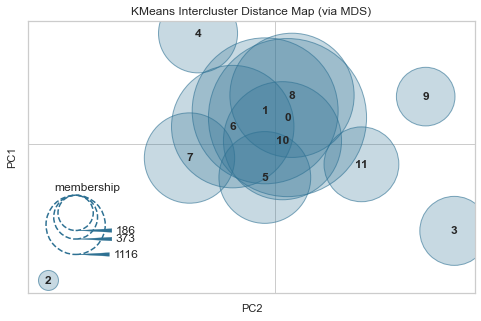

Distance entre les groupes suivant les deux premières composantes principales pour  13 clusters.


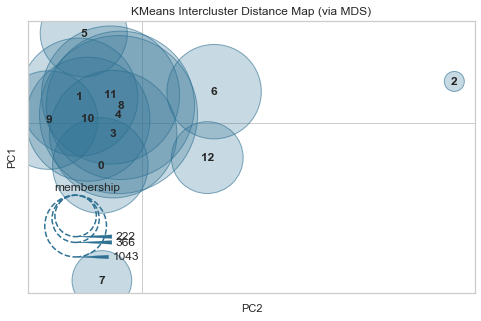

Distance entre les groupes suivant les deux premières composantes principales pour  14 clusters.


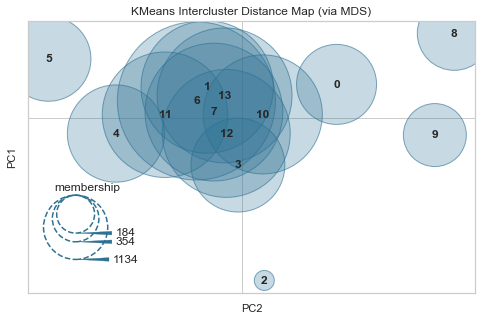

In [48]:
distance_interclusters(X_sc, range(9, 15))

Il est difficile de trancher avec ces représentations. En effet, elles représentent les projections uniquement sur les 2 premières composantes principales.
Dans un premier temps, nous choisissons de garder 6 clusters.

### Identification des clusters

Regardons la répartition des points au sein des différents clusters.

In [49]:
X, kmeans_labels = df_kmeans(X_sc,X,6)

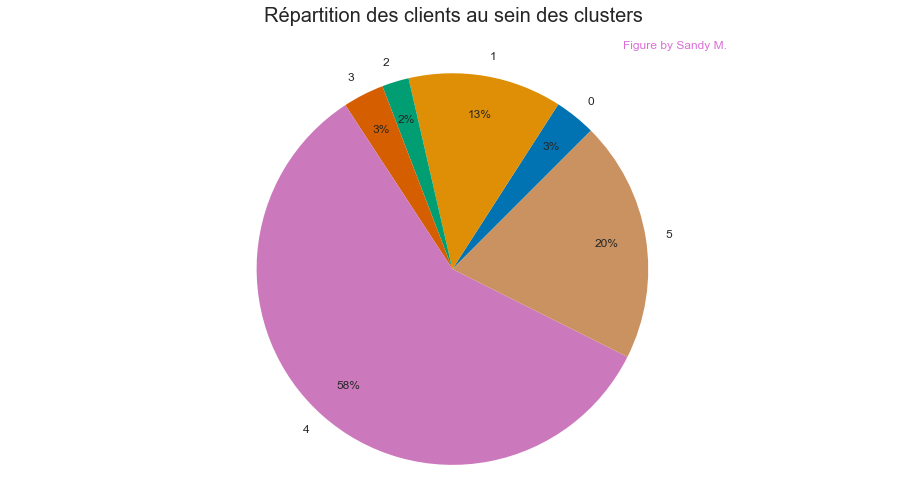

In [50]:
repartition_kmeans(X)

Pour avoir des informations par clusters, on fait la moyenne des informations suivant le numéro du cluster (toujours avec la matrice X, non standardisée) :

Nous faisons la même chose mais cette fois avec une matrice ayant subie une transformation MinMax (pour pouvoir faire une représentation dans un cercle de rayon 1).

In [51]:
X_mm_clusters_moy = df_X_mm_clusters_moy(X, kmeans_labels)
X_mm_clusters_moy

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,d_harv,cat_differentes
kmeans_label,,,,,,,,,,,,
0,0.001760,0.134590,0.005865,0.286779,0.774194,0.068983,0.013274,0.069927,0.121930,0.341349,0.210957,0.000000
1,0.000630,0.018352,0.000000,0.133603,0.135146,0.117098,0.012194,0.248077,0.015852,0.340825,0.188726,0.000000
2,0.001802,0.016679,1.000000,0.145646,0.765766,0.062901,0.006401,0.267911,0.014981,0.373608,0.185602,0.007508
3,0.185251,0.037072,0.022861,0.146524,0.770987,0.052714,0.094395,0.234548,0.013471,0.303979,0.119954,0.191740
4,0.000000,0.016866,0.000000,0.121268,0.904607,0.041865,0.004453,0.202063,0.015894,0.336384,0.083253,0.000000
5,0.000503,0.009766,0.000000,0.096807,0.889573,0.076677,0.007934,0.418587,0.008818,0.370394,0.353277,0.000000


In [52]:
#Cette fonction permet de représenter les groupes sur un radar de variables
cercle_kmeans(X_mm_clusters_moy, "kmeans_label")


*Figure by Sandy M.*

Nous faisons un tableau de contingence des variables selon leur quartile d'appartenance pour la variable en question.


*Table by Sandy M.*

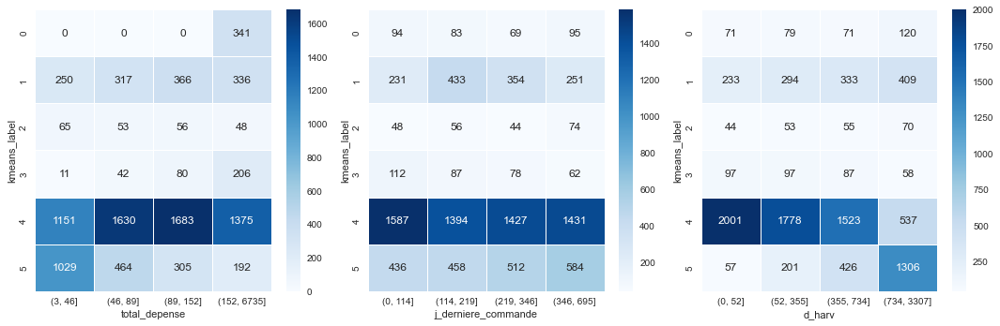

In [53]:
colonnes = ['total_depense', 'j_derniere_commande', 'd_harv']
table_cont(X,'kmeans_label',colonnes)

Une façon synthétique de voir la répartition des différents groupes au sein de la distribution des variables est de faire un tableau qui récapitule la différence relative des moyennes d'un groupe par rapport à l'ensemble des points, pour une variable donnée.


*Table by Sandy M.*

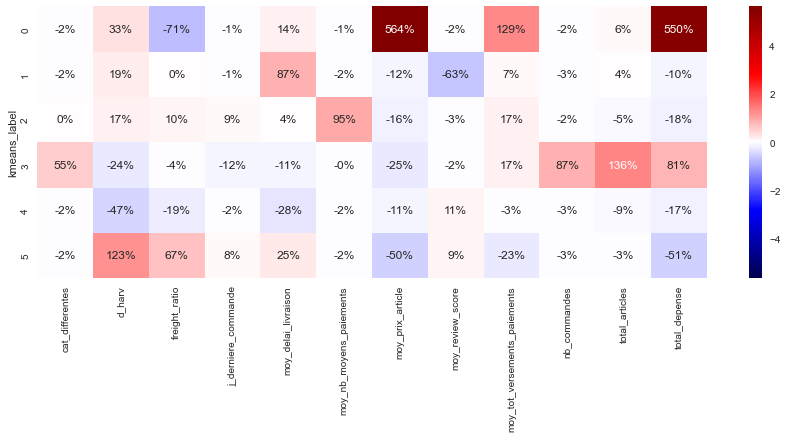

In [54]:
table_mean(X, 'kmeans_label')

Cette fois-ci les clusters sont encore plus faciles à identifier.

Cluster 0 : Clients moyennement proches de Sao Paolo. Ils ont beaucoup apprécié leur produit et dépensé peu d'argent pour une seule commande.

Cluster 1 : Clients proches de Sao Paolo. Ils n'ont effectué qu'une seule commande, ont beaucoup apprécié leur produit et ont dépensé très peu d'argent mais leur ratio de frais de transport est important.

Cluster 2 : Les clients ont commandé très peu d'articles mais pour une somme un peu plus importante. Ils ont plutôt apprécié leurs achats. Dans notre classification RFM, ils correspondent à la catégorie des dépensiers.
    
Cluster 3 : Des clients très proches de Sao Paola. Ils ont faire leur dernière (et unique) commande il n'y a pas très longtemps. Ils n'ont pas dépensé beaucoup d'argent et ont commandé très peu d'articles. Ils ont plutôt bien apprécié leurs achats. Ils ont payé en plusieurs fois.

Cluster 4 : Ils se trouvent près de Sao Paolo. Ils ont commandé quelques articles dans des catégories de produits différentes. Ils ont moins apprécié leurs produits que les autres clusters. Ils ont tendance à avoir fait plusieurs commandes. Dans notre classification RFM, ils correspondent à la catégorie des habitués.</span>

 Cluster 5 : Clients en moyenne éloignés de Sao Paolo. Ils ont des délais de livraison plus important. Ils n'ont effectué qu'une seule commande, n'ont pas tellement apprécié leur produit et ont dépensé peu d'argent.

## Méthode des K-Means Mini Batch

La méthode de l’ algorithme Mini Batch K-means repose sur l'utilisation de petits échantillons aléatoires de données (de taille fixe). A chaque itération de l'algorithme, un nouvel échantillon aléatoire est utilisé pour affiner les clusters. A chaque itération, l'apport du nouvel échantillon se réduit par rapport à l'itération précédente. Cette opération est répétée jusqu'à ce que le modèle converge, au moment où il n'y a plus de modification dans les clusters.

L'avantage de cette méthode est un gain de temps de calcul. Néanmoins, la qualité de la segmentation peut être moindre par rapport à la méthode des K-means classique.

In [55]:
# Cette fonction retourne une base de données quantitative standardisée
X, X_sc = stdX(df_ss_cat)


*Fonction by Sandy M.*

In [56]:
pca = PCA(n_components=8)
X_sc = pd.DataFrame(pca.fit_transform(X_sc),
                    index=X_sc.index,
                    columns=['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8'])

### La méthode du coude

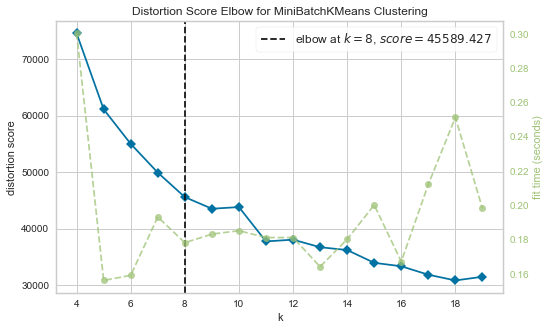


*Fonction by Sandy M.*

In [57]:
pif_kmeans(X_sc, 'distortion',(4, 20), MiniBatchKMeans())

En suivant la méthode du coude, le nombre k choisi est celui à partir duquel la variance (distortion sur le graphique, par défaut, le métrique est "distortion") ne se réduit plus de façon significative. Sur ce graphique il se trouve à 8.

### Silhouette

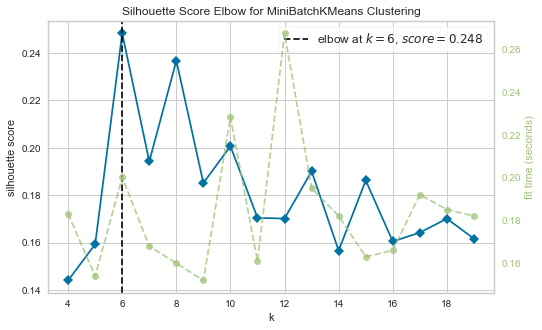


*Fonction by Sandy M.*

In [58]:
pif_kmeans(X_sc, 'silhouette',(4, 20), MiniBatchKMeans())

Le nombre optimal de k a l'air d'être 6 sur cette représentation.

Les représentations des scores silhouette pour les différents clusters et pour les différentes valeurs de k sont présentées ci-dessous.


*Fonction by Sandy M.*

Pour un nombre de clusters = 4 , le score Silhouette moyen est : 0.26
Pour un nombre de clusters = 5 , le score Silhouette moyen est : 0.28
Pour un nombre de clusters = 6 , le score Silhouette moyen est : 0.25
Pour un nombre de clusters = 7 , le score Silhouette moyen est : 0.23
Pour un nombre de clusters = 8 , le score Silhouette moyen est : 0.21


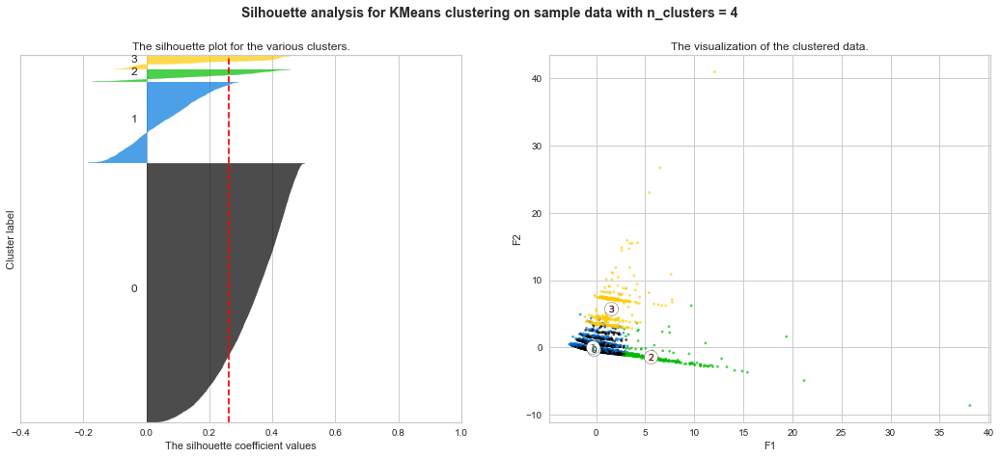

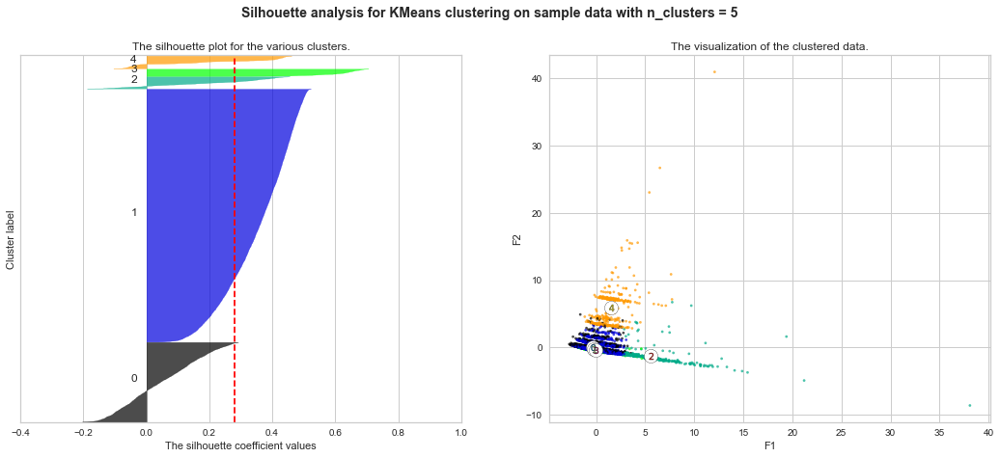

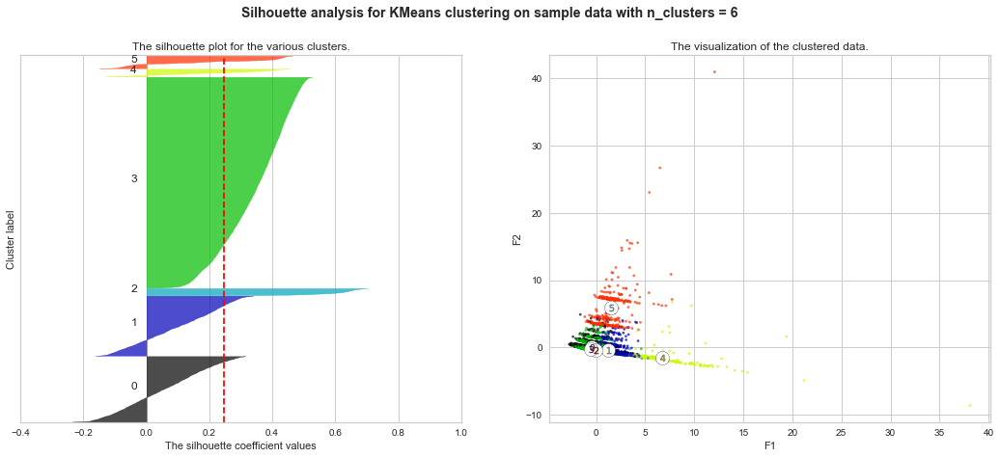

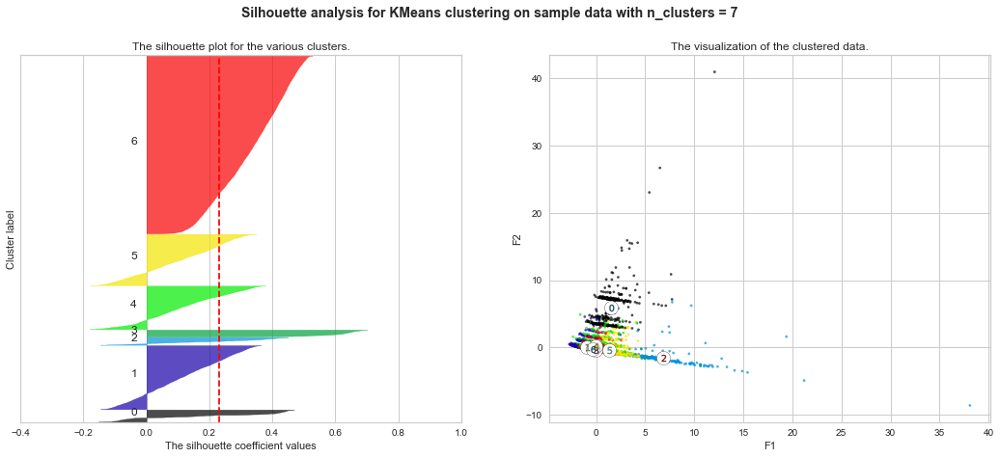

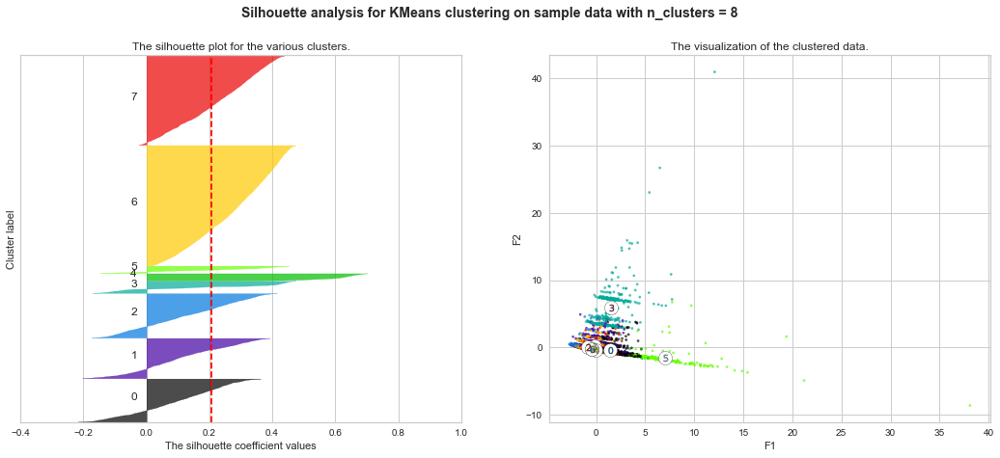

In [59]:
range_n_clusters = [4, 5, 6, 7, 8]

# Cette fonction donne les différents scores silhouette ainsi que les représentations correspondantes
silhou(range_n_clusters, X_sc, 'F1', 'F2')

Prenons l'exemple pour 6 clusters (k). La proportion des groupes est bien répartie excepté pour les 5 derniers groupes. La séparation des clusters est relativement correcte. Quelques erreurs de clusters sont visibles, notamment pour les groupes 1, 3 et 4.  
A droite sont représentées les données selon deux composantes principales (les valeurs sont standardisées). Rien qu'avec ces deux variables il est possible de distinguer 2 groupes, le groupe 4 et le groupe 1, qui correspondent tous les deux à des valeurs atypiques soit pour le montant total des dépenses (groupe 4), soit pour le nombre de commandes (groupe 1).

### L'indice de Calinski-Harabasz

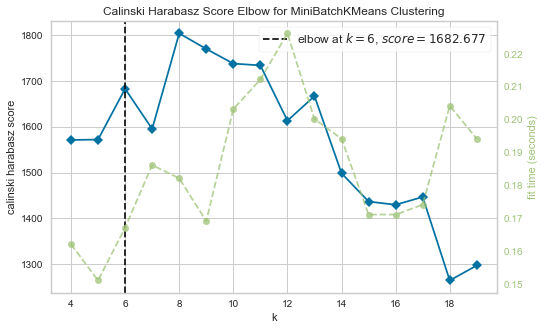


*Fonction by Sandy M.*

In [60]:
pif_kmeans(X_sc, 'calinski_harabasz',(4, 20),MiniBatchKMeans())

D'après cette représentation, le nombre de k optimal est 5 si l'on s'appuie sur l'indice de Calinski-Harabasz.

### L'indice de Davies-Bouldin

Pour cet indice, plus il est proche de 0, meilleure est la classification.


*Fonction by Sandy M.*

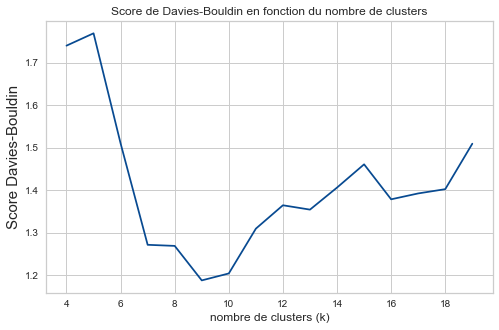

In [61]:
graph_davies_bouldin_mini(X_sc, range(4, 20))

### Distances intercluster

Nous avons la possibilité de choisir entre les valeurs 5 et 9 comme nombre de clusters. Une façon de trancher est de regarder la distance entre les différents clusters pour voir s'ils sont correctement séparés.


*Fonction by Sandy M.*

Distance entre les groupes suivant les deux premières composantes principales pour  9 clusters.


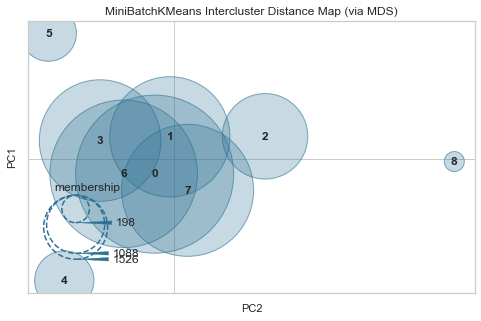

Distance entre les groupes suivant les deux premières composantes principales pour  10 clusters.


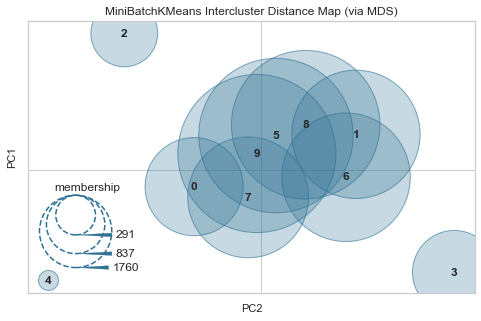

Distance entre les groupes suivant les deux premières composantes principales pour  11 clusters.


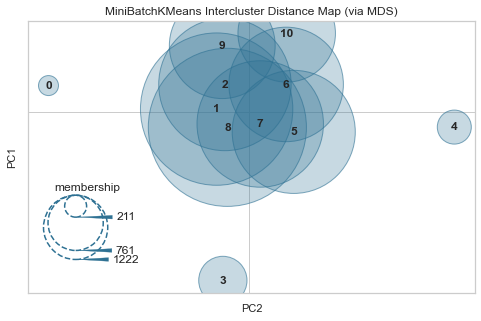

Distance entre les groupes suivant les deux premières composantes principales pour  12 clusters.


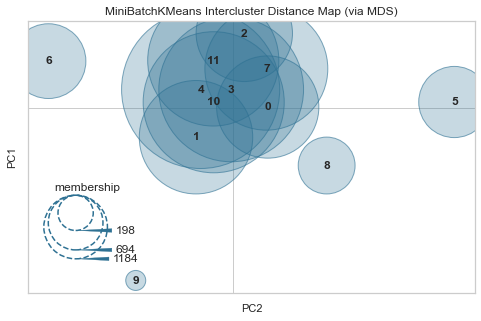

Distance entre les groupes suivant les deux premières composantes principales pour  13 clusters.


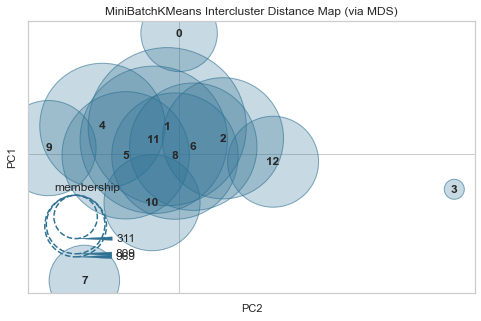

Distance entre les groupes suivant les deux premières composantes principales pour  14 clusters.


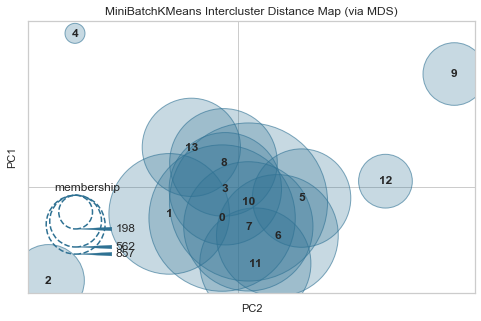

In [62]:
distance_interclusters_mini(X_sc, range(9, 15))

Il est difficile de trancher avec ces représentations. En effet, elles représentent les projections uniquement sur les 2 premières composantes principales.
Dans un premier temps, nous choisissons de garder 5 clusters.

### Identification des clusters

Regardons la répartition des points au sein des différents clusters.

In [63]:
X, kmeans_labels = df_kmeans_mini(X_sc,X,5)

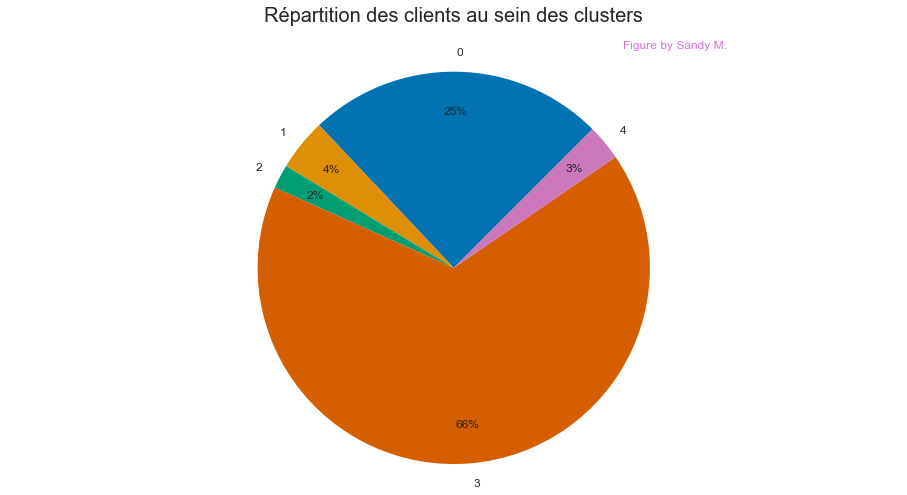

In [64]:
repartition_kmeans(X)

Pour avoir des informations par clusters, on fait la moyenne des informations suivant le numéro du cluster (toujours avec la matrice X, non standardisée) :

Nous faisons la même chose mais cette fois avec une matrice ayant subie une transformation MinMax (pour pouvoir faire une représentation dans un cercle de rayon 1).

In [65]:
X_mm_clusters_moy = df_X_mm_clusters_moy(X, kmeans_labels)
X_mm_clusters_moy

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,d_harv,cat_differentes
kmeans_label,,,,,,,,,,,,
0,0.000000,0.020404,0.000000,0.146716,0.602588,0.105774,0.009780,0.284201,0.018955,0.378678,0.134078,0.000000
1,0.097775,0.037092,0.009953,0.104403,0.731177,0.056312,0.149883,0.277592,0.013260,0.323988,0.060609,0.152225
2,0.000000,0.016824,1.000000,0.105640,0.804293,0.056167,0.007382,0.264928,0.015631,0.360587,0.064571,0.000000
3,0.000000,0.013545,0.000000,0.046433,0.862381,0.043971,0.006721,0.263237,0.012902,0.325863,0.036215,0.000000
4,0.000850,0.154713,0.005102,0.247874,0.799745,0.067025,0.010204,0.060794,0.143485,0.329917,0.087629,0.001134


Nous faisons un tableau de contingence des variables selon leur quartile d'appartenance pour la variable en question.


*Table by Sandy M.*

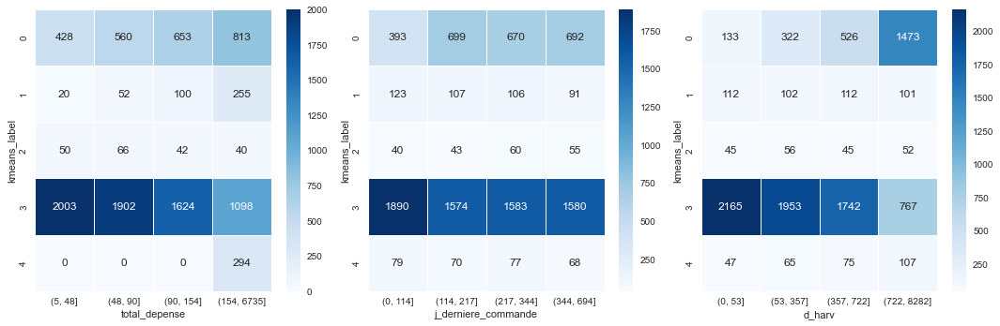

In [66]:
colonnes = ['total_depense', 'j_derniere_commande', 'd_harv']
table_cont(X,'kmeans_label',colonnes)

In [67]:
cercle_kmeans(X_mm_clusters_moy, "kmeans_label")


*Figure by Sandy M.*

Une façon synthétique de voir la répartition des différents groupes au sein de la distribution des variables est de faire un tableau qui récapitule la différence relative des moyennes d'un groupe par rapport à l'ensemble des points, pour une variable donnée.


*Table by Sandy M.*

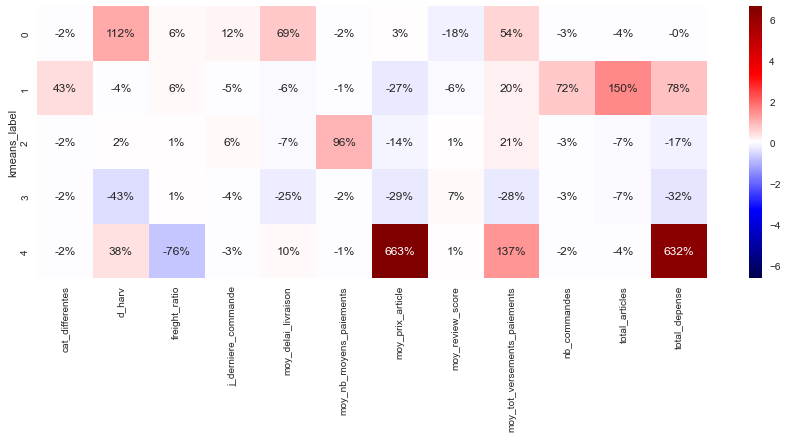

In [68]:
table_mean(X, 'kmeans_label')

Cette méthode donne 5 groupes qui ont des caractéristiques plus nuancées que ceux avec la méthode des K-means. Néanmoins, quand la base de données s'étendra, il sera intéressant de voir l'économie de temps qu'elle permet de faire et s'il est judicieux de sa servir de cette méthode comme d'une première évaluation des groupes de clients.

# Méthode des K-means avec la base de données entière

In [69]:
# Cette fonction effectue un standard scaler et une PCA sur la base de données
X, X_sc = prep_df_X_full(df_ss_cat)


*Fonction by Sandy M.*

## La méthode du coude

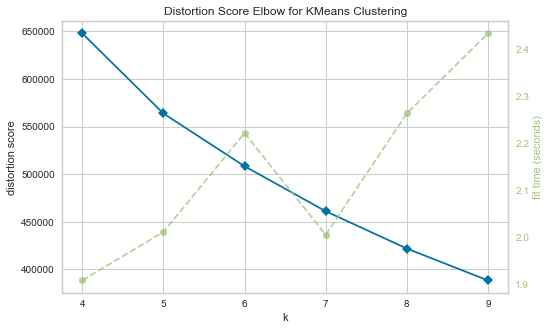


*Fonction by Sandy M.*

In [70]:
pif_kmeans(X_sc, 'distortion',(4, 10))

En suivant la méthode du coude, le nombre k choisi est celui à partir duquel la variance (distortion sur le graphique, par défaut, le métrique est "distortion") ne se réduit plus de façon significative. Sur ce graphique il se trouve à 5 ou 6.

## Silhouette

Le partitionnement optimal sera pour le k qui correspondra au coefficient de silhouette le plus élevé.

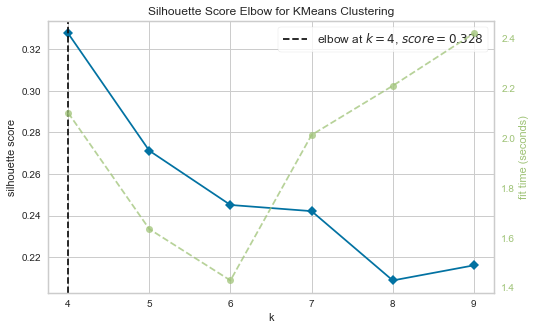


*Fonction by Sandy M.*

In [71]:
pif_kmeans(X_sc, 'silhouette',(4, 10))

Le nombre optimal de k a l'air d'être 4 ou 5 sur cette représentation. Nous remarquons que les scores silhouette sont moins élevés que pour le cas précédent.

Le score silhouette pour chaque point est normalisé par la valeur maximale. Nous obtenons ainsi un score compris entre -1 et 1. Ceci permet d'évaluer l'efficacité de la séparation des points en différents clusters et de distinguer la proportion de points qui ont été attribués au mauvais cluster par l'algorithme. 

Les représentations des scores silhouette pour les différents clusters et pour les différentes valeurs de k sont présentées ci-dessous.


*Fonction by Sandy M.*

Pour un nombre de clusters = 5 , le score Silhouette moyen est : 0.27
Pour un nombre de clusters = 6 , le score Silhouette moyen est : 0.25
Pour un nombre de clusters = 7 , le score Silhouette moyen est : 0.25
Pour un nombre de clusters = 8 , le score Silhouette moyen est : 0.21


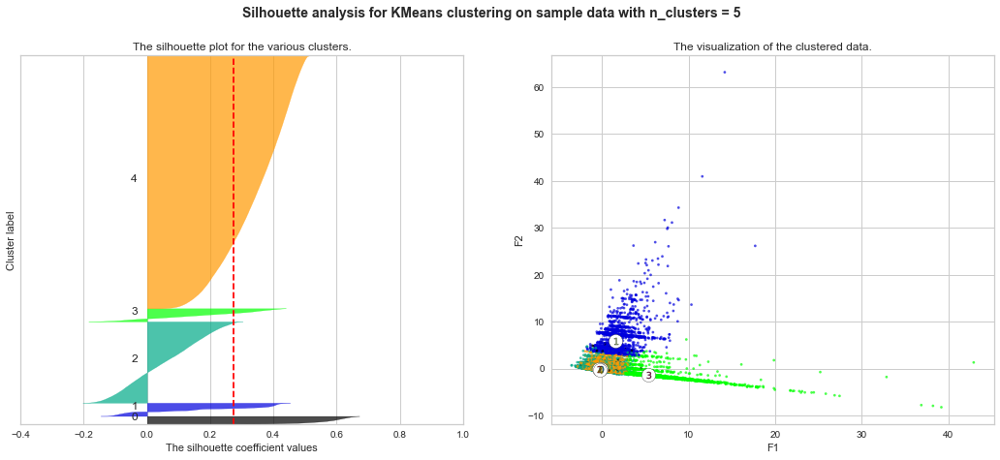

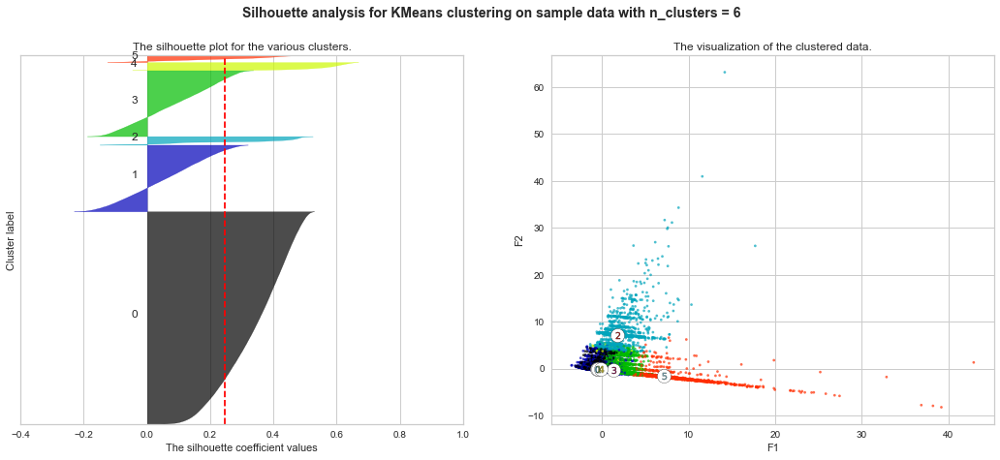

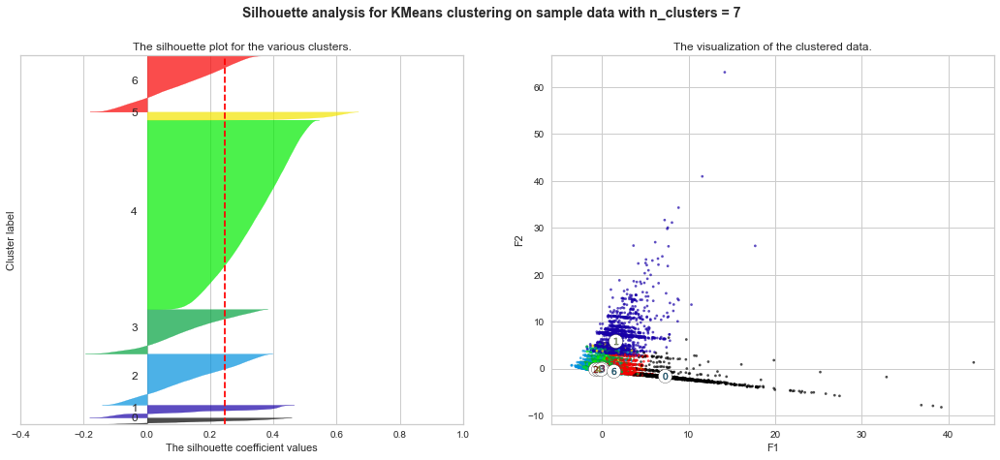

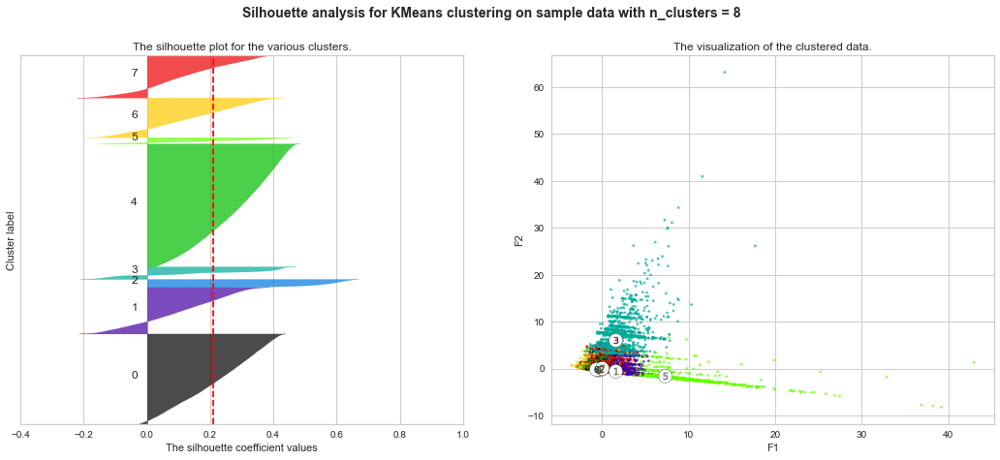

In [72]:
range_n_clusters = [5, 6, 7, 8]

# Cette fonction donne les différents scores silhouette ainsi que les représentations correspondantes
silhou(range_n_clusters, X_sc, 'F1', 'F2')

Avec la PCA avant l'algorithme des k-means, les groupes sont plus faciles à visualiser. Prenons l'exemple pour 6 clusters (k). La proportion des groupes est bien répartie excepté pour les  groupes 2, 4 et 5. La séparation des clusters est relativement correcte. Quelques erreurs de clusters sont visibles, notamment pour les groupes 1 et 3.  
A droite sont représentées les données selon deux composantes principales. Il est possible de distinguer 3 groupes, le groupe 2, le groupe 3 et le groupe 5.

## L'indice de Calinski-Harabasz

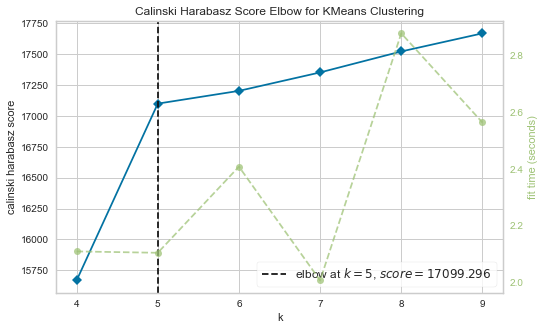


*Fonction by Sandy M.*

In [73]:
pif_kmeans(X_sc, 'calinski_harabasz',(4, 10))

D'après cette représentation, le nombre de k optimal est 5 si l'on s'appuie sur l'indice de Calinski-Harabasz.

## L'indice de Davies-Bouldin

Pour cet indice, plus il est proche de 0, meilleure est la classification.


*Fonction by Sandy M.*

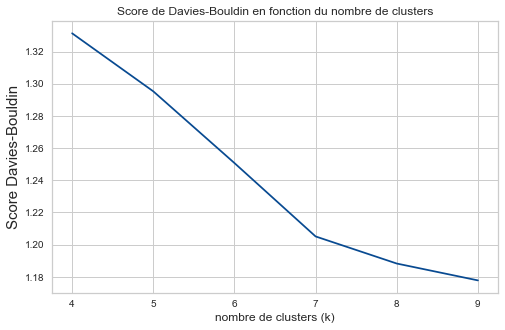

In [74]:
graph_davies_bouldin(X_sc, range(4, 10))

Si l'on se réfère à cet indice, le nombre optimal de clusters serait 7.

## Distances intercluster

Nous avons la possibilité de choisir entre les valeurs 6 et 8 comme nombre de clusters. Une façon de trancher est de regarder la distance entre les différents clusters pour voir s'ils sont correctement séparés.


*Fonction by Sandy M.*

Distance entre les groupes suivant les deux premières composantes principales pour  5 clusters.


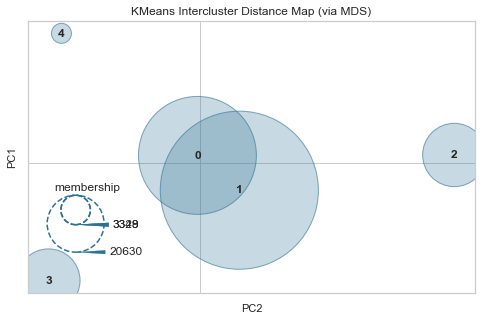

Distance entre les groupes suivant les deux premières composantes principales pour  6 clusters.


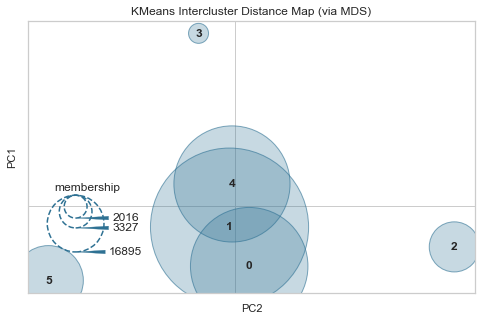

Distance entre les groupes suivant les deux premières composantes principales pour  7 clusters.


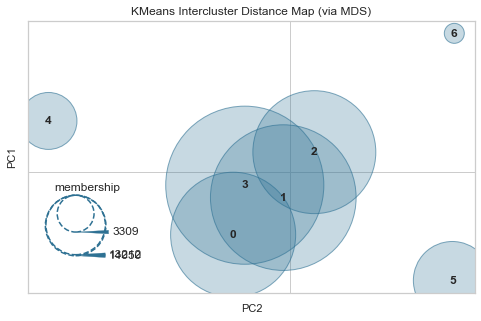

Distance entre les groupes suivant les deux premières composantes principales pour  8 clusters.


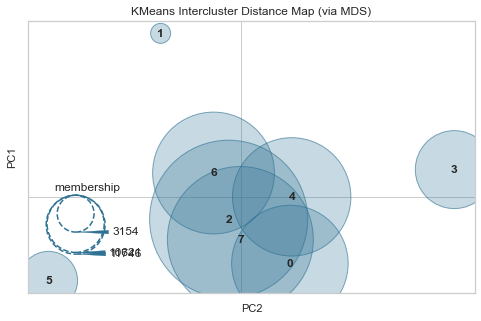

In [75]:
distance_interclusters(X_sc, range(5, 9))

Il est difficile de trancher avec ces représentations. En effet, elles représentent les projections uniquement sur les 2 premières composantes principales.
Dans un premier temps, nous choisissons de garder 6 clusters.

## Identification des clusters

Regardons la répartition des points au sein des différents clusters.

In [76]:
X, kmeans_labels = df_kmeans(X_sc,X,6)

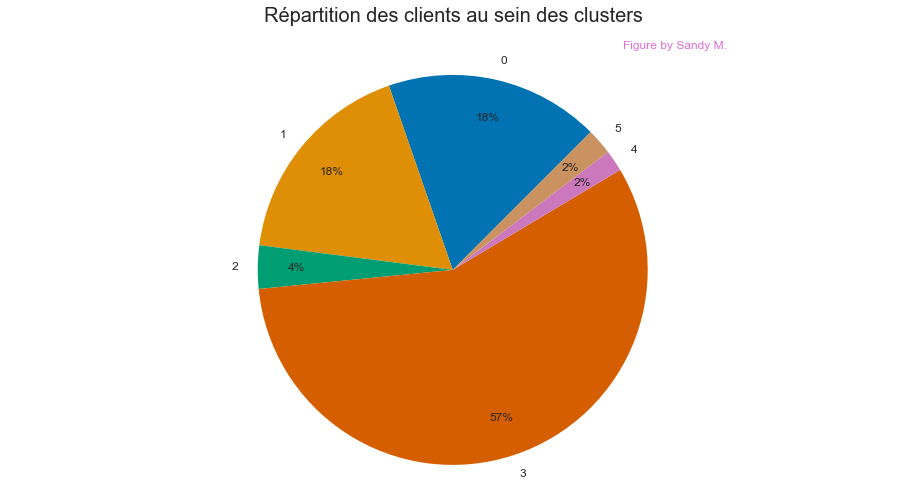

In [77]:
repartition_kmeans(X)

Pour avoir des informations par clusters, on fait la moyenne des informations suivant le numéro du cluster (toujours avec la matrice X, non standardisée) :

Nous faisons la même chose mais cette fois avec une matrice ayant subie une transformation MinMax (pour pouvoir faire une représentation dans un cercle de rayon 1).

In [78]:
X_mm_clusters_moy = df_X_mm_clusters_moy(X, kmeans_labels)
X_mm_clusters_moy

,nb_commandes,total_depense,moy_nb_moyens_paiements,moy_tot_versements_paiements,moy_review_score,moy_delai_livraison,total_articles,freight_ratio,moy_prix_article,j_derniere_commande,d_harv,cat_differentes
kmeans_label,,,,,,,,,,,,
0,0.000155,0.007064,0.000060,0.094407,0.539691,0.109110,0.006509,0.306268,0.012752,0.360730,0.153161,0.000000
1,0.000035,0.017674,0.000000,0.264990,0.803372,0.051076,0.007130,0.123210,0.032294,0.365084,0.058528,0.000000
2,0.064896,0.018857,0.016977,0.134416,0.750560,0.050493,0.078248,0.213578,0.014219,0.303151,0.054629,0.136057
3,0.000000,0.006269,0.000000,0.067037,0.866512,0.039429,0.004207,0.222812,0.011683,0.315449,0.035853,0.000000
4,0.000782,0.093823,0.009726,0.253051,0.774949,0.064878,0.006105,0.048075,0.173651,0.331331,0.090555,0.000152
5,0.000638,0.008614,0.999835,0.135394,0.784485,0.055947,0.005521,0.227508,0.015862,0.364410,0.067724,0.002108


In [79]:
cercle_kmeans(X_mm_clusters_moy, "kmeans_label")


*Figure by Sandy M.*

Nous faisons un tableau de contingence des variables selon leur quartile d'appartenance pour la variable en question.


*Table by Sandy M.*

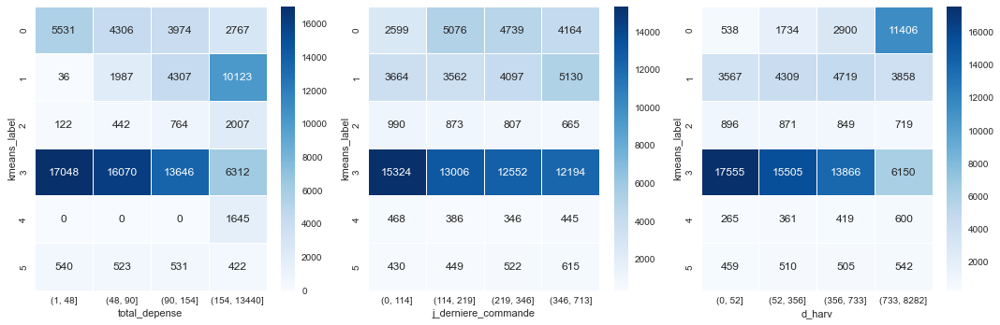

In [80]:
colonnes = ['total_depense', 'j_derniere_commande', 'd_harv']
table_cont(X,'kmeans_label',colonnes)

Une façon synthétique de voir la répartition des différents groupes au sein de la distribution des variables est de faire un tableau qui récapitule la différence relative des moyennes d'un groupe par rapport à l'ensemble des points, pour une variable donnée.


*Table by Sandy M.*

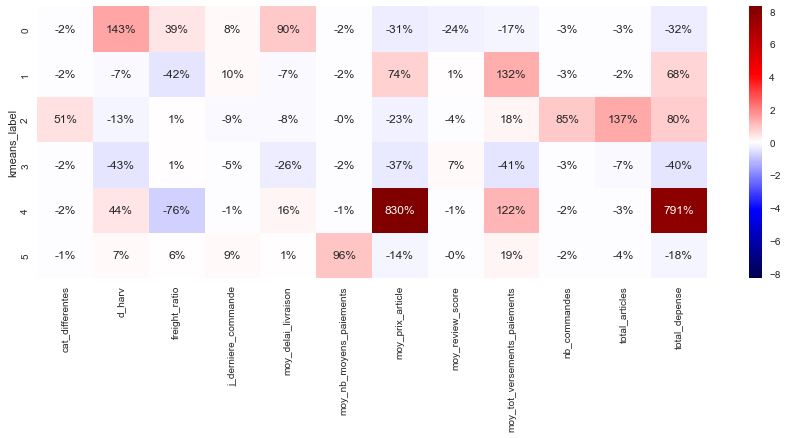

In [81]:
table_mean(X, 'kmeans_label')

Nous retrouvons les groupes obtenus avec l'échantillon de 10% des données.